In [ ]:
# Load the SavedModel
import tensorflow as tf

model = tf.keras.models.load_model('./model8k_v4_org_sabah')

In [ ]:
""""
model = models.Sequential(
    [
        layers.Conv1D(512, 3, activation="relu", input_shape=(X_train.shape[1], X_train.shape[2])),
        layers.MaxPooling1D(2),
        layers.Conv1D(64, 3, activation="relu"),
        layers.MaxPooling1D(2),
        layers.Conv1D(32, 3, activation="relu"),
        layers.Dropout(0.2),
        layers.MaxPooling1D(2),
        layers.Conv1D(8, 3, activation="relu"),
        layers.MaxPooling1D(2),
        layers.Flatten(),
        # model.add(LSTM(64)),
        layers.Dense(8, activation="relu"),
        layers.Dense(1, activation="sigmoid"),
    ]
)
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
"""

model.summary()

In [ ]:
import cv2
import matplotlib.pyplot as plt

color_img = cv2.imread('colorscale_jet.jpg')
colors = []
for i in range(0,len(color_img[15]), 5):
  colors.append(color_img[15][i])

plt.imshow(color_img)

In [ ]:
import cv2
# from google.colab.patches import cv2_imshow

def overlay_image(pred, pred_list, divide_number = 40):

    image = cv2.imread('trace_image.png')
    overlay = image.copy()

    # image sizes
    # print(overlay.shape)

    # Rectangle parameters
    x, y, w, h = 80, 60, 680, 150

    rect_with_offset = w // divide_number

    for i in range(divide_number):
        color_index = (100 - int(pred_list[i] * 100))
        # color_index = color_index
        if pred < 0.49:
            color_index = 100 - color_index

        # print(color_index)
        b, g, r = colors[color_index // 2]
        overlay = cv2.rectangle(overlay, (x + i * rect_with_offset, y), (x + (i + 1) * rect_with_offset, y + h), (int(b), int(g), int(r)), -1)

    # A filled rectangle
    # cv2.rectangle(overlay, (x, y), (x+w, y+h), (0, 200, 0), -1)

    alpha = 0.5  # Transparency factor.
    # Following line overlays transparent rectangle
    # over the image
    image_new = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

    cv2.imwrite("attention_signal.jpg", image_new)


    # concatenate both images
    image_new = cv2.vconcat([image, image_new])

    # cv2.imshow('Image', image_new)
    # cv2.waitKey(0)

    import matplotlib.pyplot as plt
    size = (10, 10)
    fig, ax = plt.subplots(figsize=size, )
    ax.imshow(image_new)
    plt.show()

    # cv2.destroyAllWindows()


In [ ]:
from obspy import read, Trace
import numpy as np


def colorize(path, divide_number = 40, size_of_length_signal = 8000):

    trace = read(path)[0]
    # print(f" 1 {trace.data.shape}")
    # trace.plot()

    avg_num = np.average(trace.data)
    avg = np.zeros(size_of_length_signal // divide_number) + avg_num

    tmp = Trace(data = avg)
    # tmp.plot()

    predict_data = trace.data.reshape((1, len(trace.data), 1))

    t_pred = model.predict(predict_data)
    # for y_val in t_pred:
    #   print( "%.5f" % float(y_val), end = ", ")

    pred_list = []

    for i in range(divide_number):
        start_index = i * (len(predict_data[0]) // divide_number)
        end_index = (i + 1) * (len(predict_data[0]) // divide_number)

        # Protect the original data by making a copy
        original_data = predict_data.copy()

        # Replace the section of predict_data with yummydata
        for index in range(len(avg)):
            predict_data[0][index + start_index] = avg[index]
            # predict_data[0][start_index:end_index] = yummydata[:]

        d = np.array([])
        for index in range(len(trace.data)):
            # d.insert(predict_data[0][index][0])
            d = np.append(d, predict_data[0][index][0])

        d.reshape((1, size_of_length_signal))
        pl = Trace(data = d)
        # pl.plot()

        # # Perform the prediction on the modified predict_data
        y_pred = model.predict(predict_data)
        for y_val in y_pred[0]:
            # print("%.5f" % float(y_val), end=", ")
            pred_list.append(float(y_val))

        # # Restore the original data
        predict_data = original_data.copy()


    trace = Trace(data = predict_data[0].flatten())
    # trace.plot()
    trace.plot(outfile='trace_image.png')

    overlay_image(t_pred, pred_list, divide_number)
    
    return trace, t_pred, pred_list




In [6]:
import os

dataset = 'dataset8k_v4'

original_class_folder = "class8/original/"
original_trace_file_list = []

for trace_file in os.listdir(os.path.join(dataset, original_class_folder)):
    original_trace_file_list.append(trace_file)

original_trace_file_list.sort()

# for trace_file in original_trace_file_list:
#     print(f"original {trace_file}")

cs = 0 
index = 0

0 : dataset8k_v4/class8/original/201901_0_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


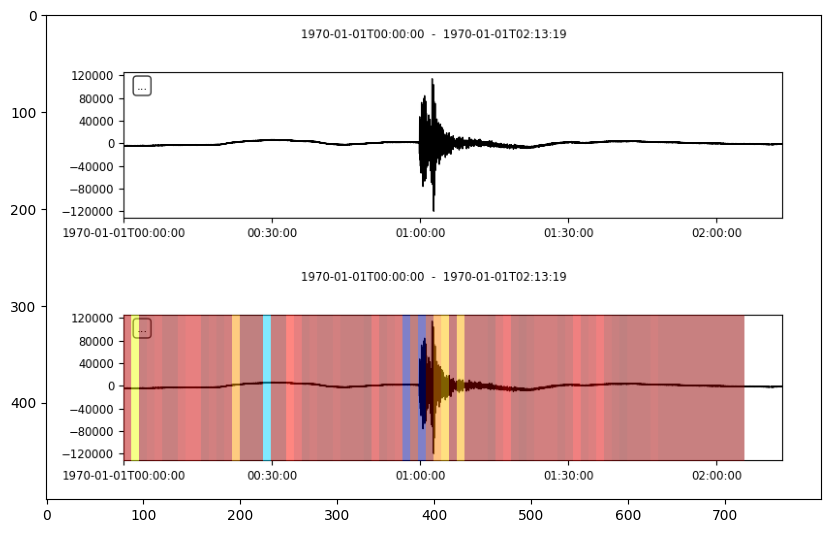

saved 1 files
1 : dataset8k_v4/class8/original/201901_10_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 24ms/step


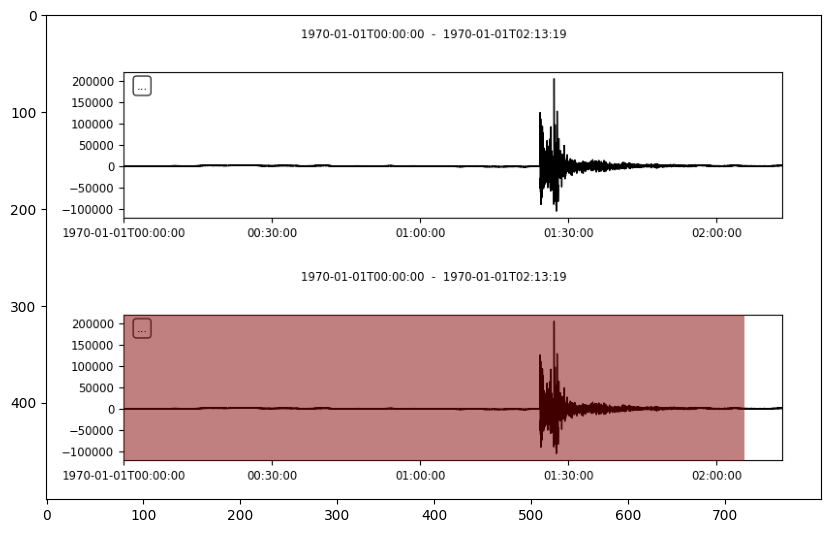

2 : dataset8k_v4/class8/original/201901_11_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


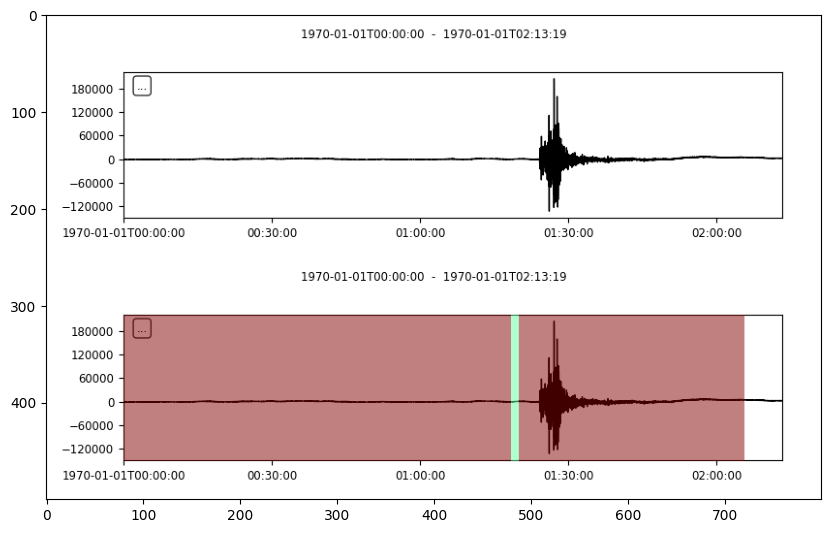

3 : dataset8k_v4/class8/original/201901_14_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


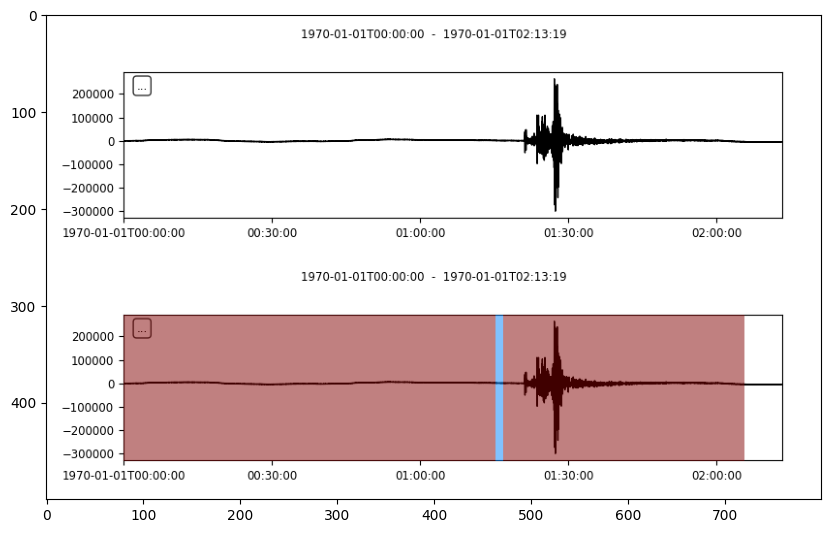

4 : dataset8k_v4/class8/original/201901_1_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


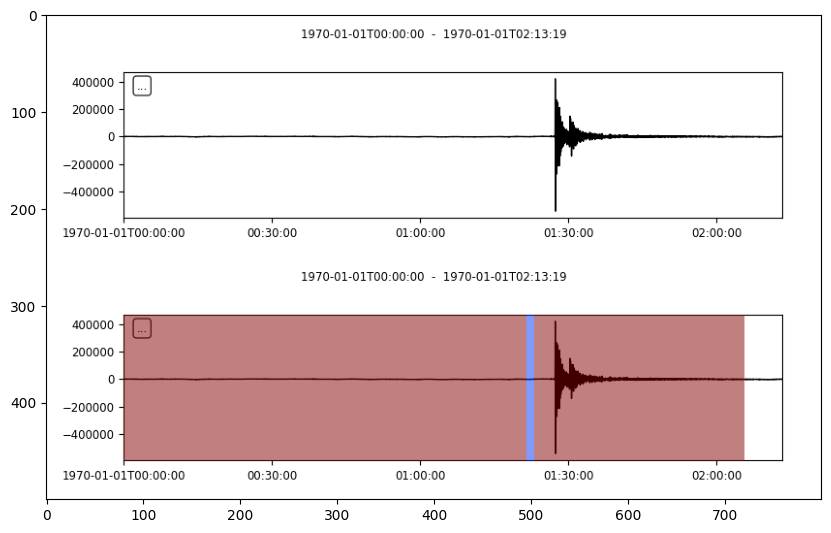

5 : dataset8k_v4/class8/original/201901_20_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


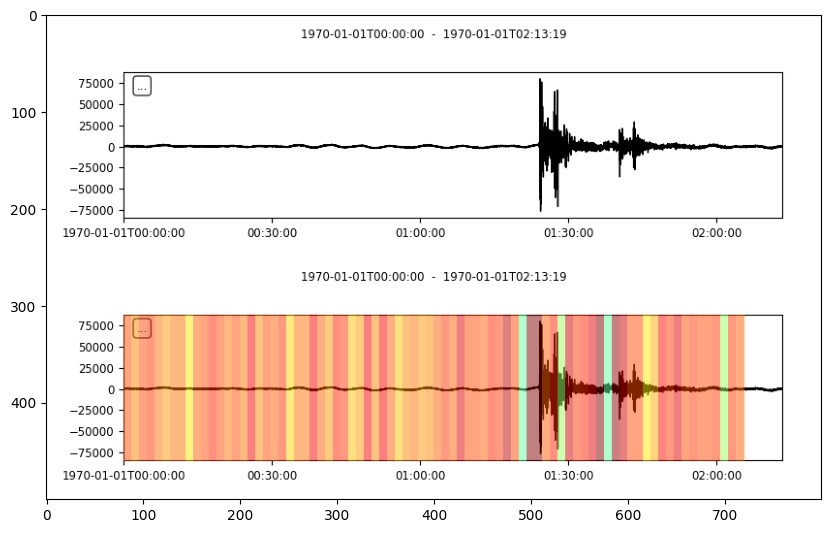

saved 2 files
6 : dataset8k_v4/class8/original/201901_23_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


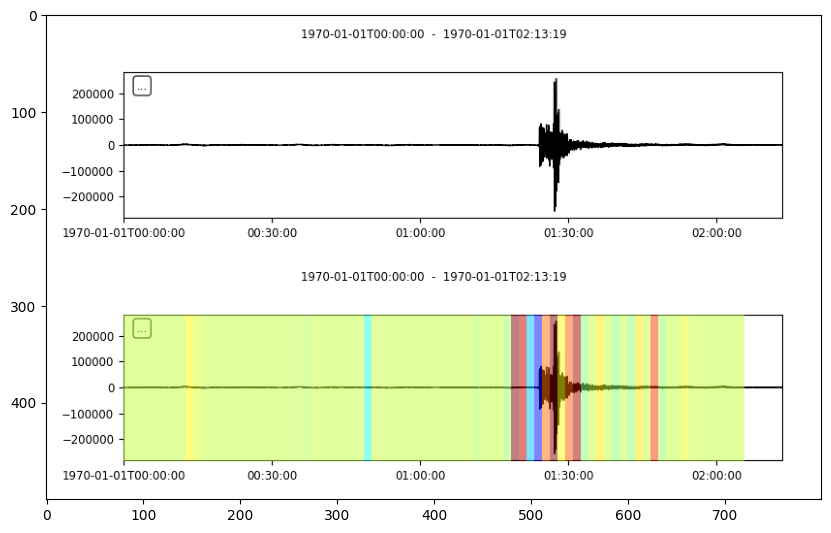

saved 3 files
7 : dataset8k_v4/class8/original/201902_2_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


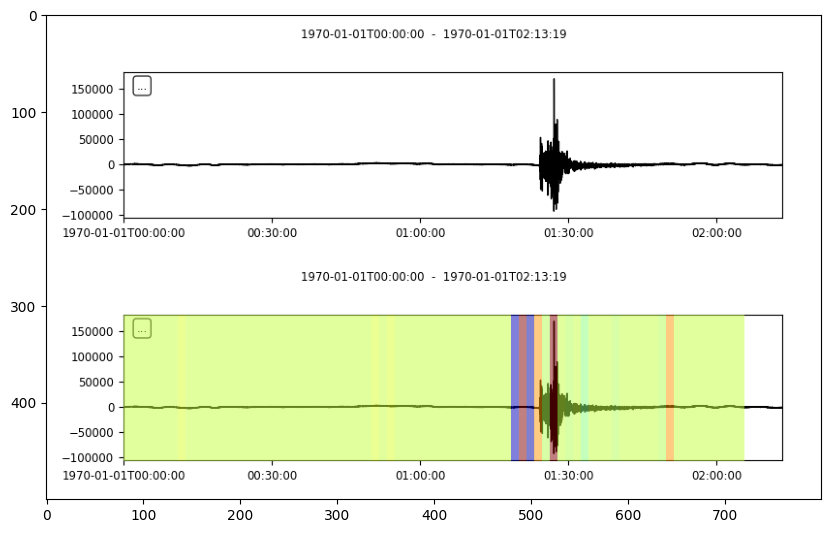

saved 4 files
8 : dataset8k_v4/class8/original/201903_0_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


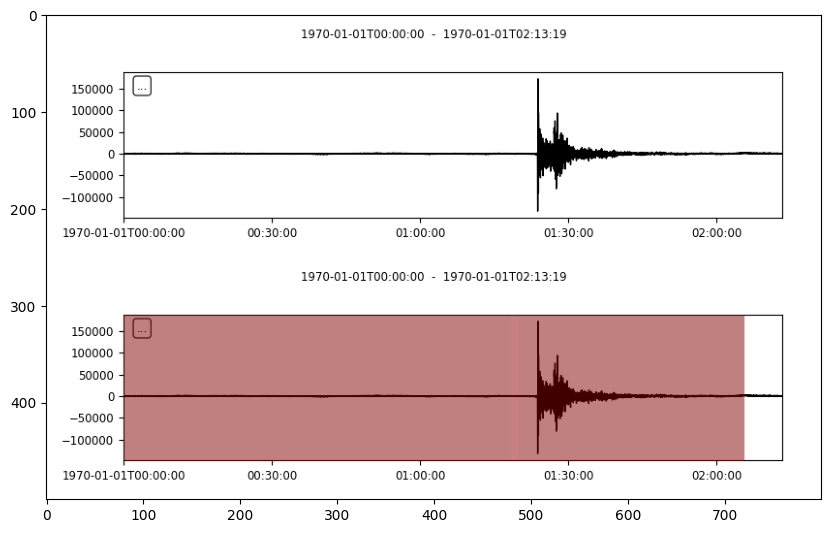

9 : dataset8k_v4/class8/original/201903_13_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


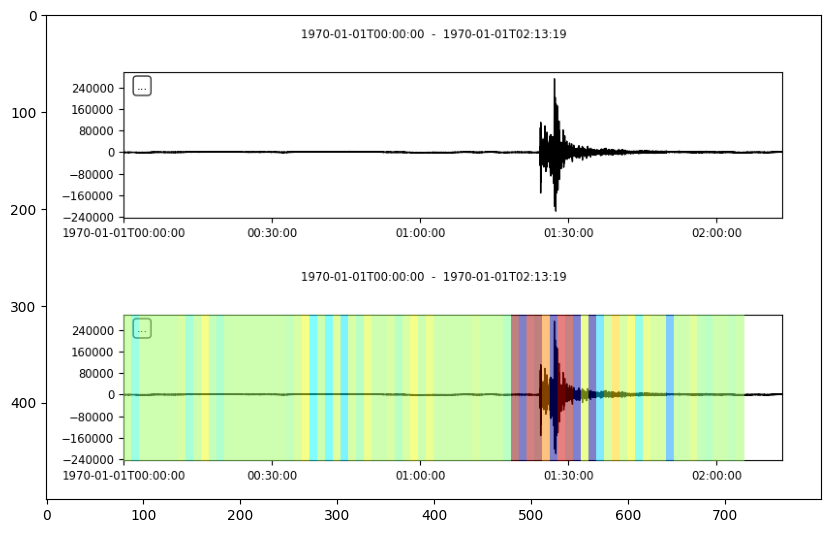

saved 5 files
10 : dataset8k_v4/class8/original/201903_2_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


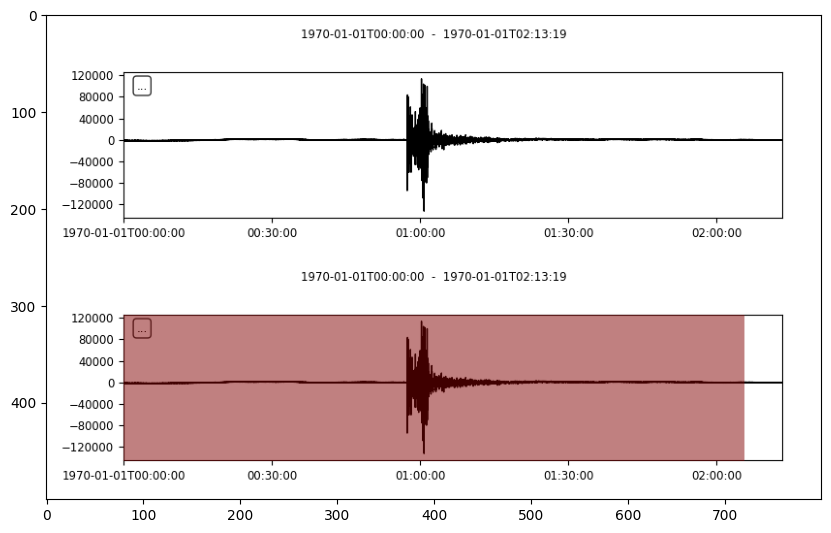

11 : dataset8k_v4/class8/original/201904_14_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


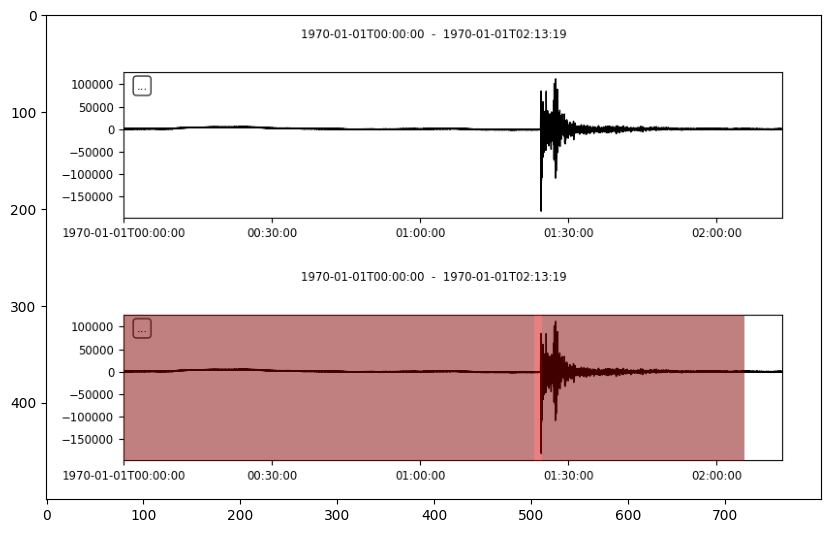

12 : dataset8k_v4/class8/original/201904_18_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


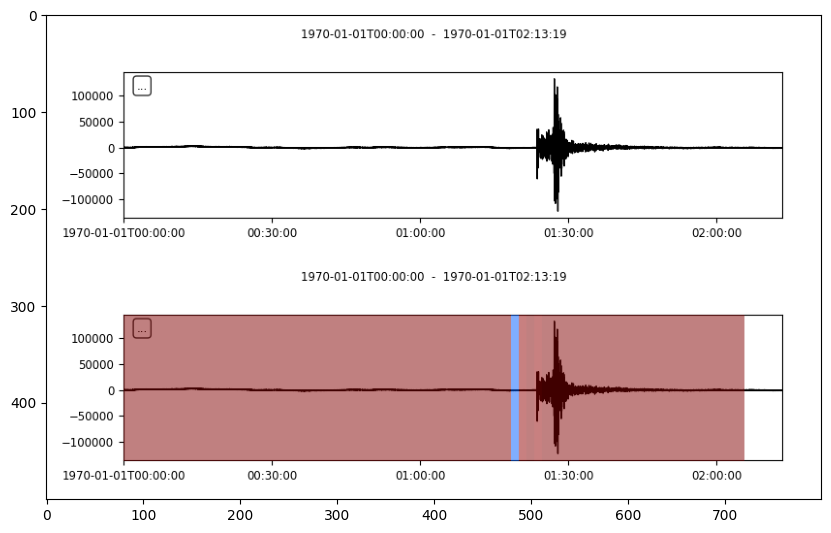

13 : dataset8k_v4/class8/original/201904_7_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


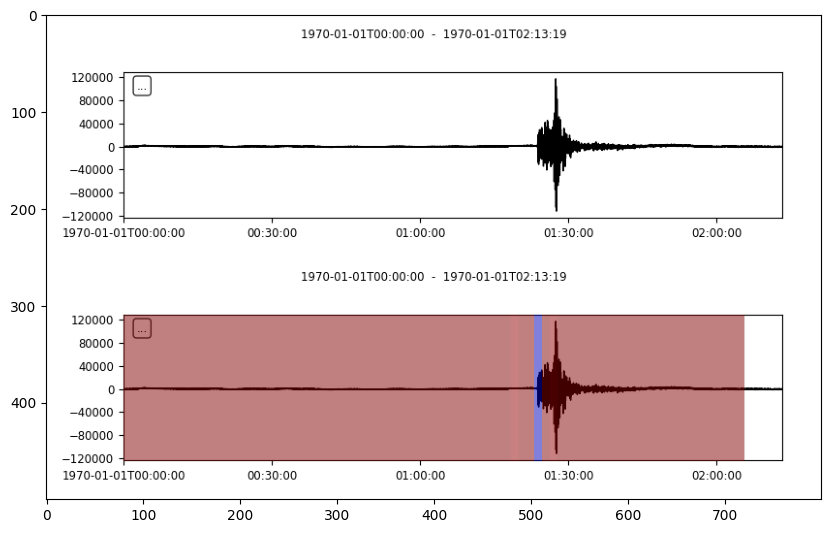

14 : dataset8k_v4/class8/original/201905_12_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


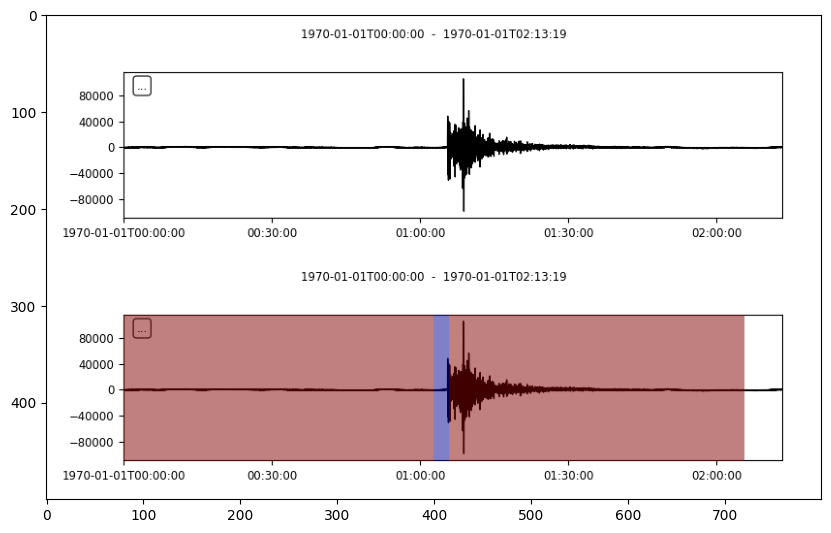

15 : dataset8k_v4/class8/original/201905_3_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


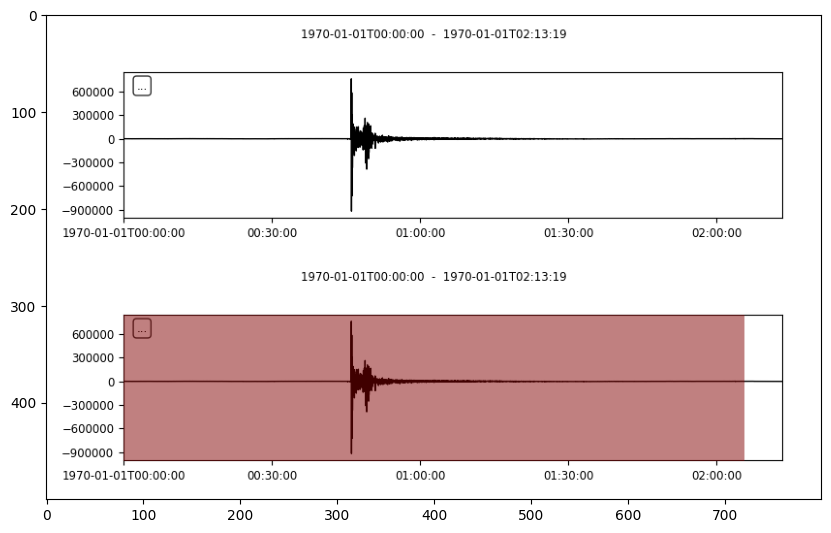

16 : dataset8k_v4/class8/original/201905_4_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


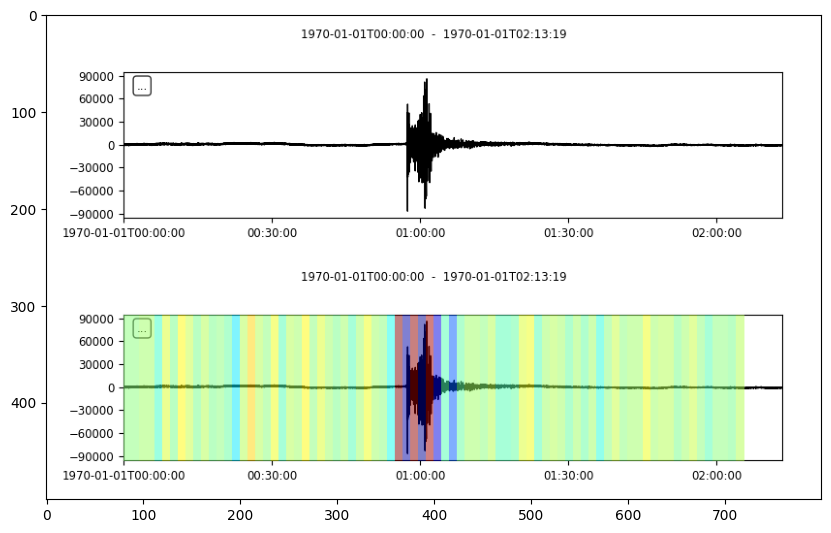

saved 6 files
17 : dataset8k_v4/class8/original/201906_12_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


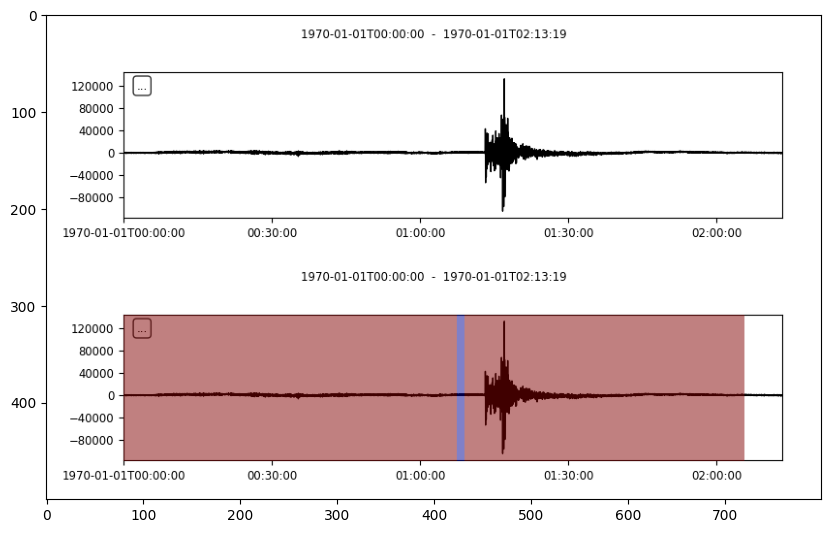

18 : dataset8k_v4/class8/original/201906_8_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


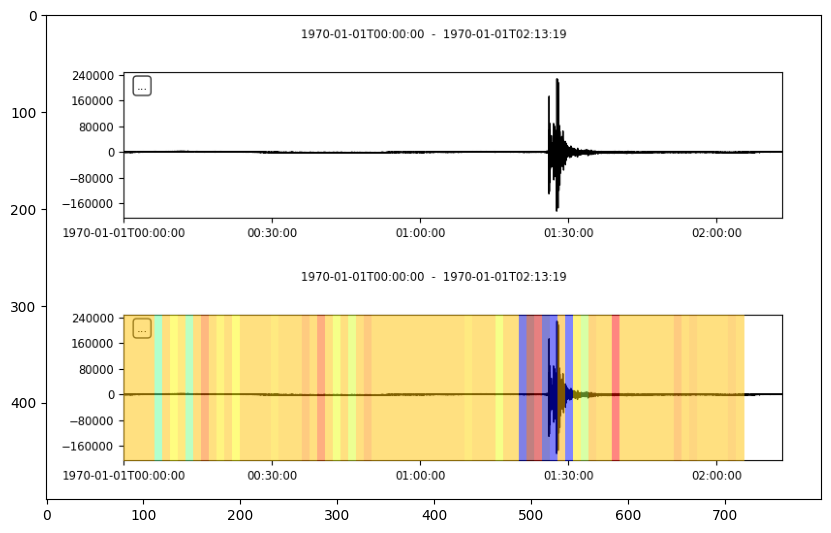

saved 7 files
19 : dataset8k_v4/class8/original/201906_9_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


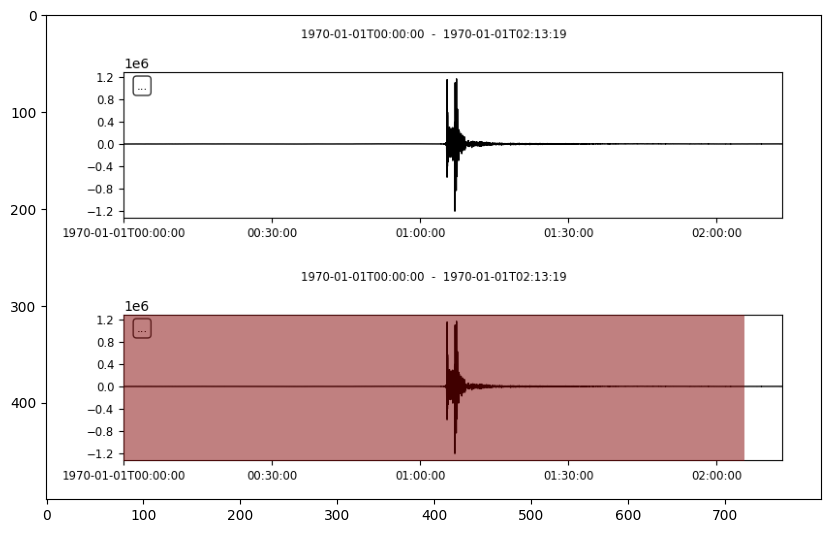

20 : dataset8k_v4/class8/original/201907_10_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


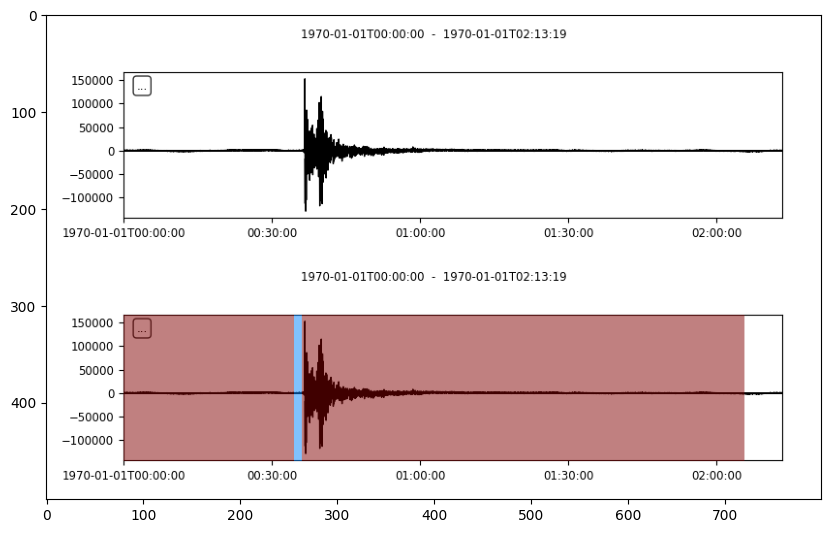

21 : dataset8k_v4/class8/original/201907_11_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


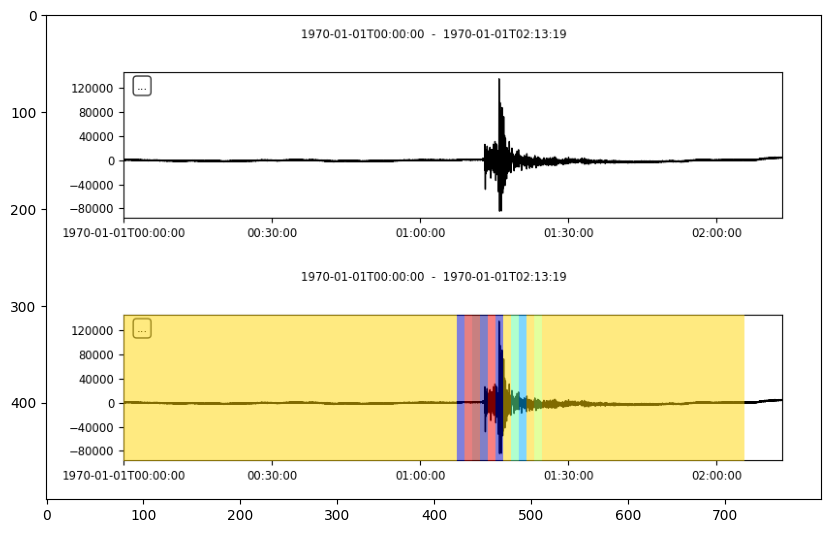

saved 8 files
22 : dataset8k_v4/class8/original/201907_17_18__KO.SIMA..BHZ.D.2019.195.172300.SAC_original.sac
1/1 [==============================] - 0s 22ms/step


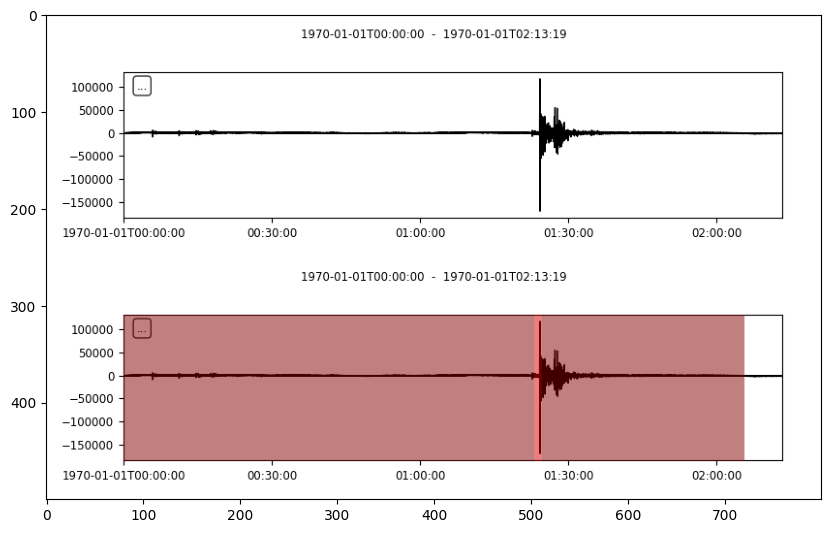

23 : dataset8k_v4/class8/original/201907_18_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


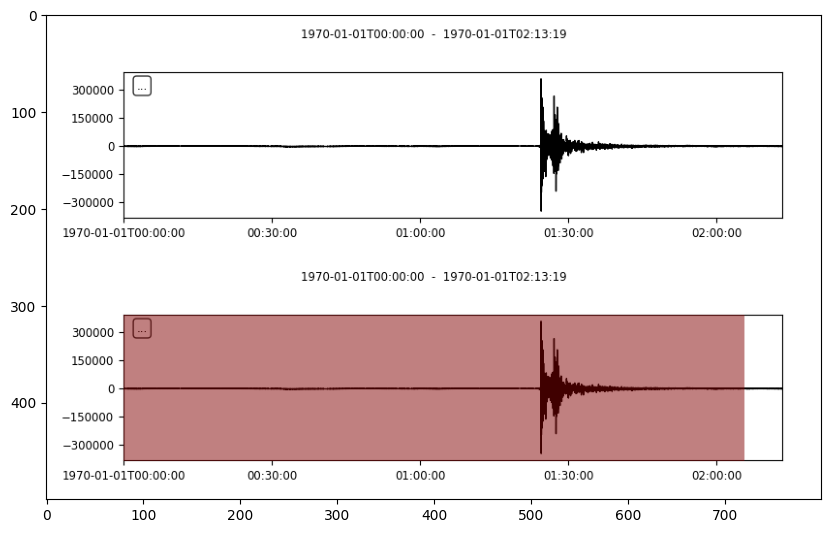

24 : dataset8k_v4/class8/original/201907_20_34__KO.SIMA..BHZ.D.2019.186.000859.SAC_original.sac
1/1 [==============================] - 0s 19ms/step


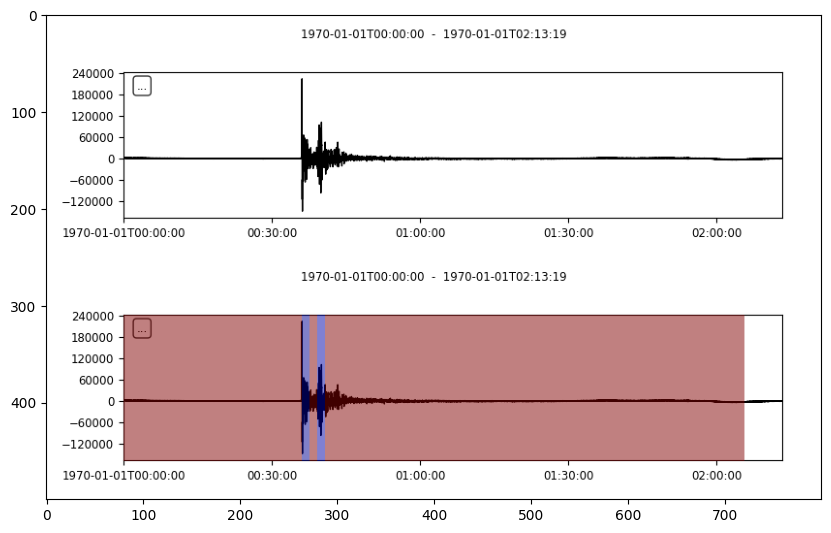

25 : dataset8k_v4/class8/original/201907_21_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


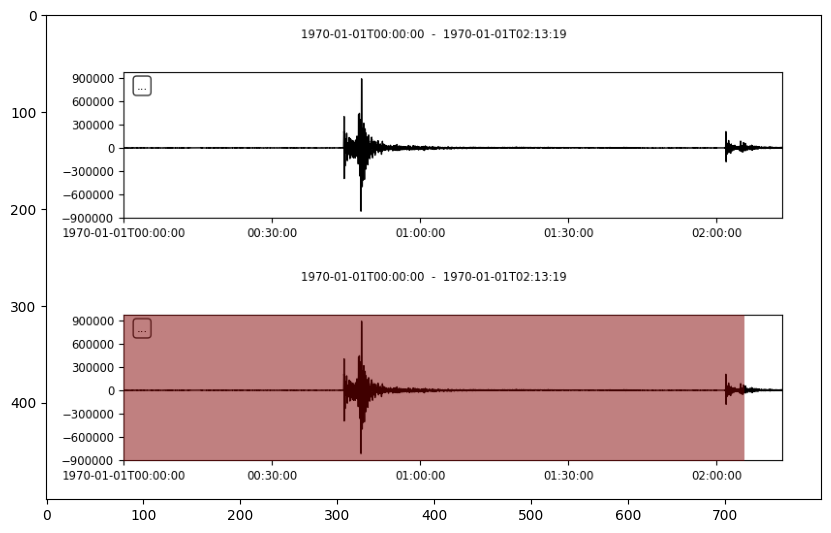

26 : dataset8k_v4/class8/original/201907_23_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 17ms/step


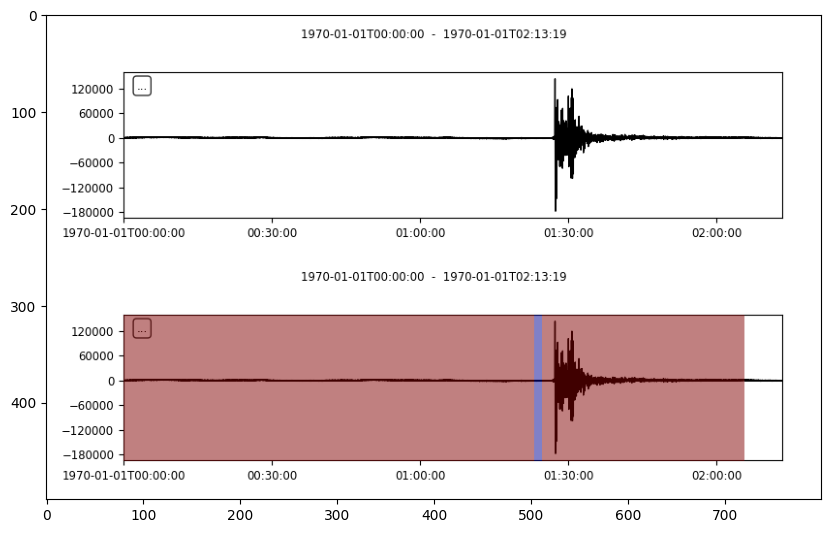

27 : dataset8k_v4/class8/original/201907_2_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


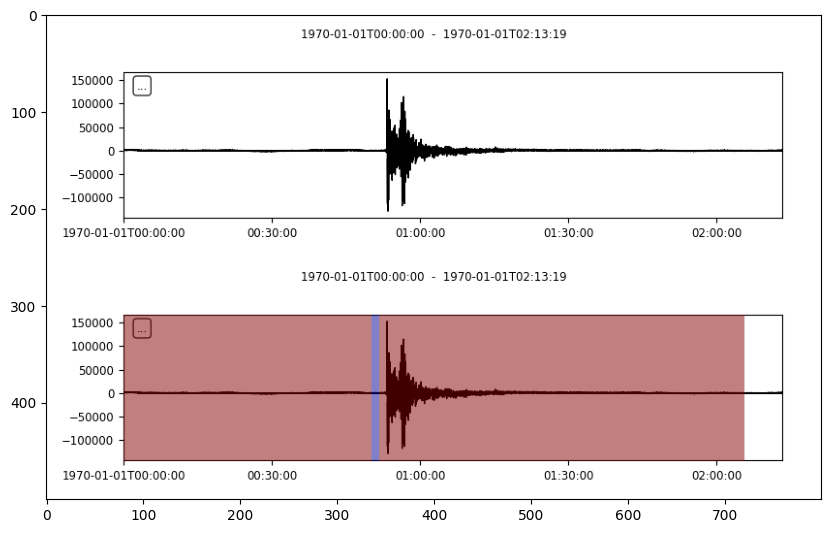

28 : dataset8k_v4/class8/original/201908_12_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


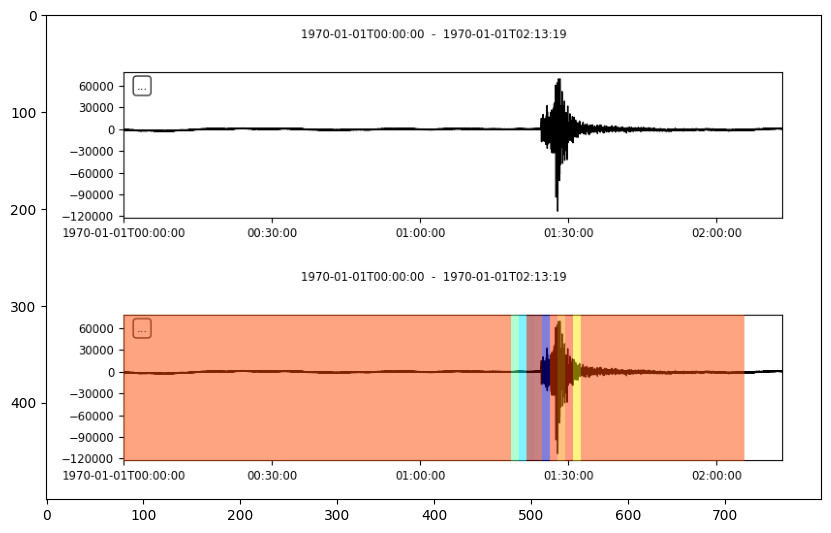

saved 9 files
29 : dataset8k_v4/class8/original/201908_13_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


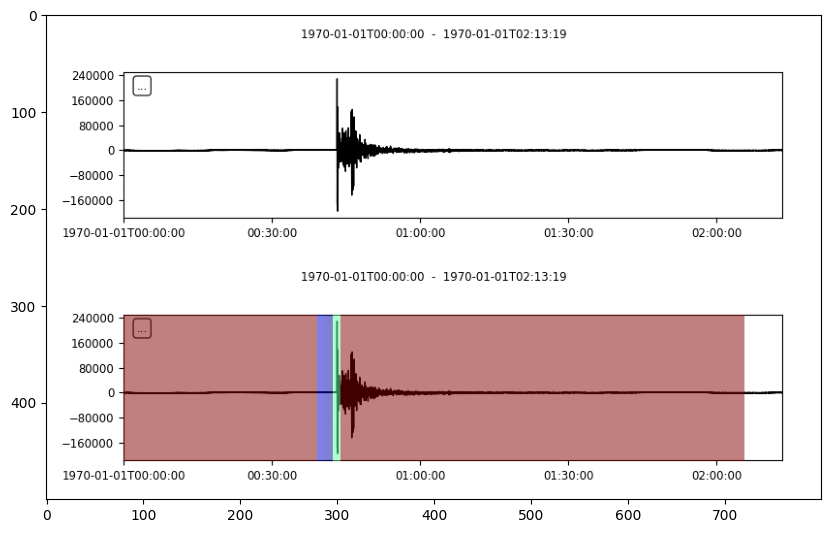

30 : dataset8k_v4/class8/original/201908_14_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


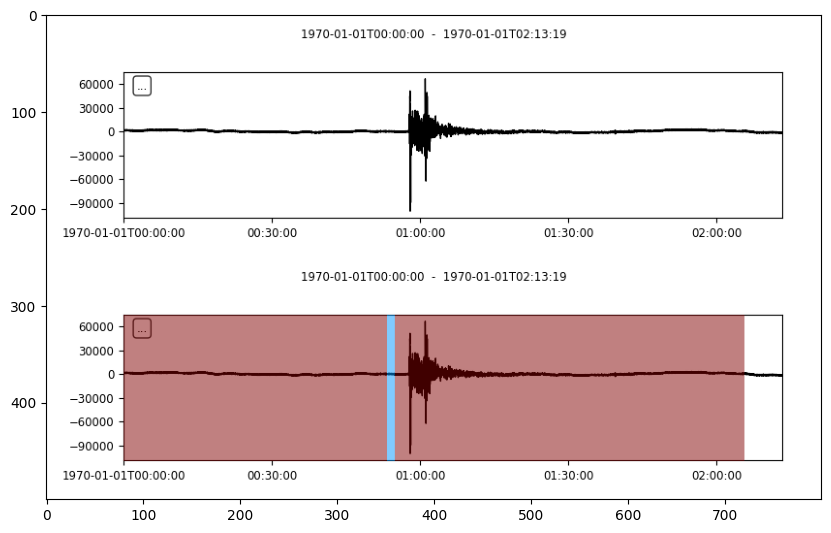

31 : dataset8k_v4/class8/original/201909_0_53__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


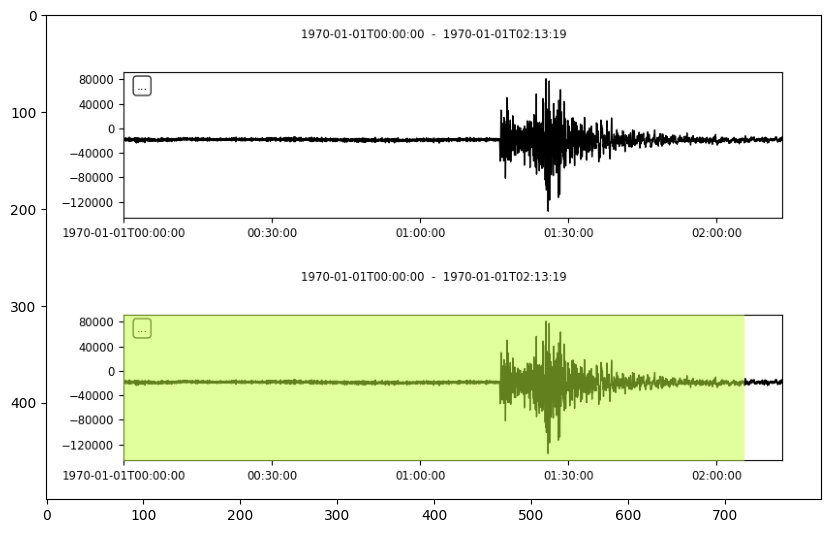

32 : dataset8k_v4/class8/original/201910_18_112__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


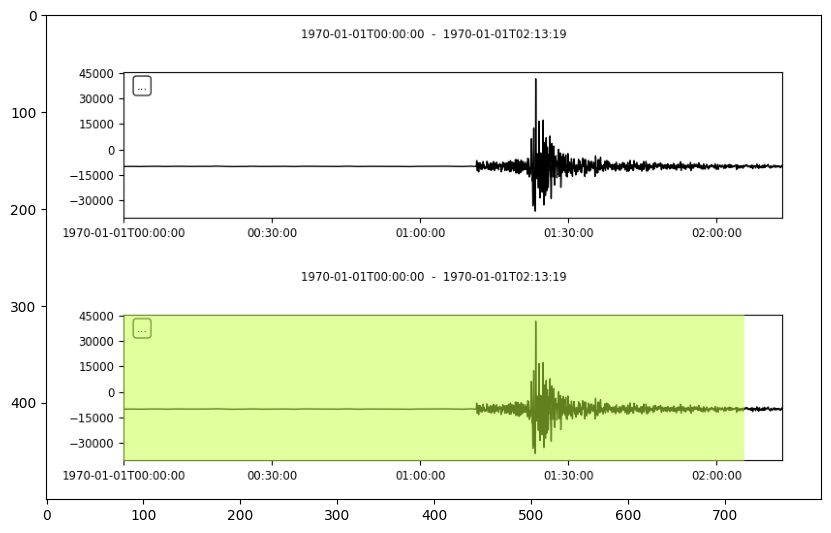

33 : dataset8k_v4/class8/original/201910_18_117__ARMT.BHZ.KO_original.sac
1/1 [==============================] - 0s 23ms/step


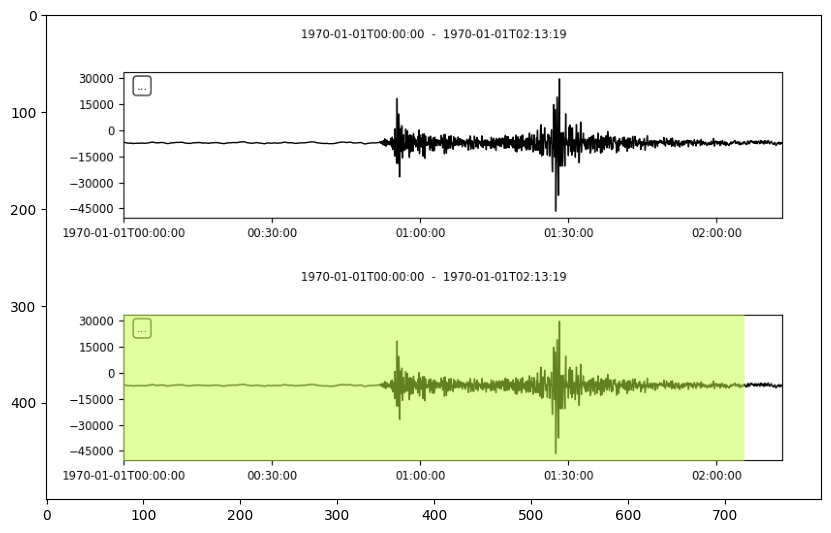

34 : dataset8k_v4/class8/original/201910_18_147__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


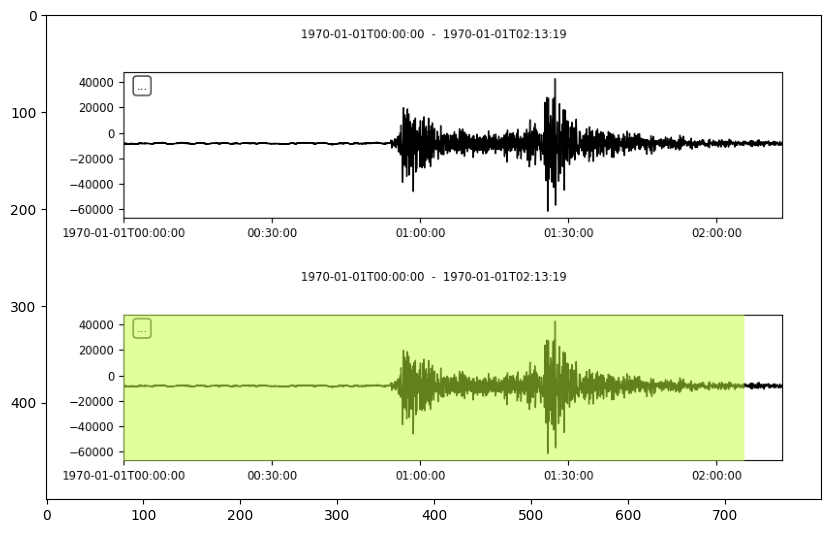

35 : dataset8k_v4/class8/original/201910_18_91__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


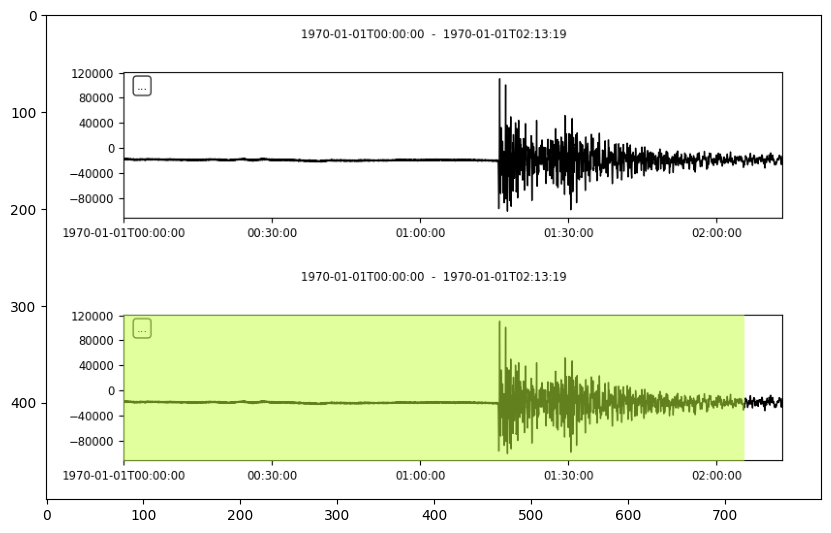

36 : dataset8k_v4/class8/original/201910_19_62__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


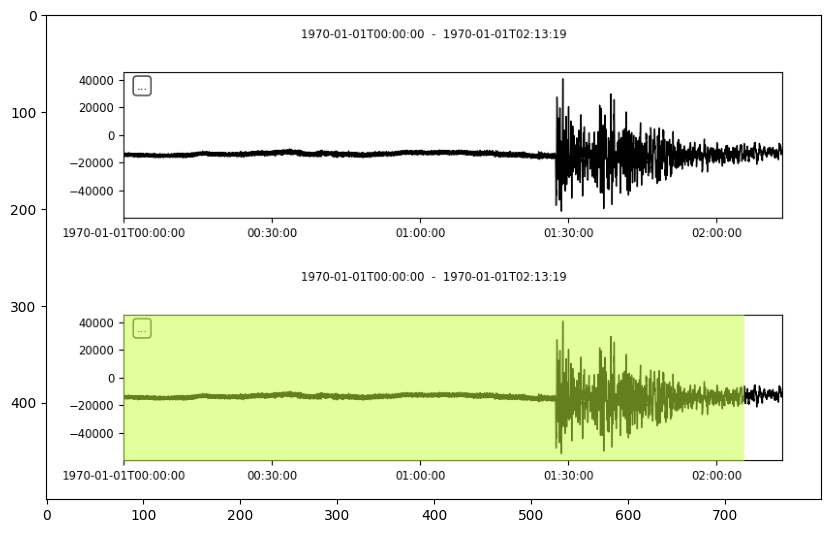

37 : dataset8k_v4/class8/original/201911_19_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


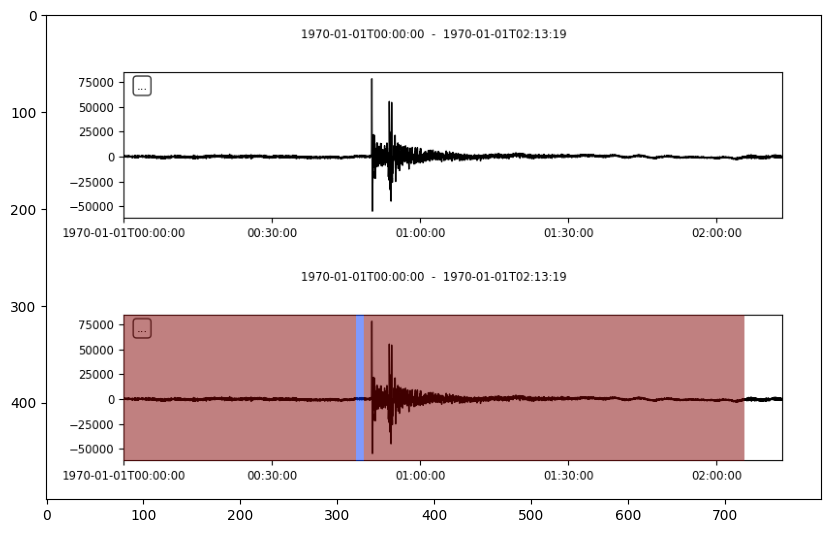

38 : dataset8k_v4/class8/original/201911_25_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


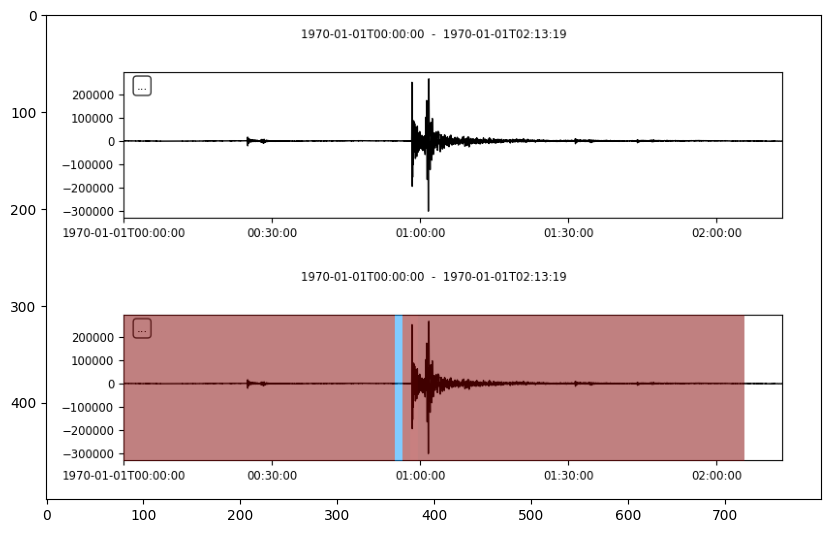

39 : dataset8k_v4/class8/original/201911_2_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


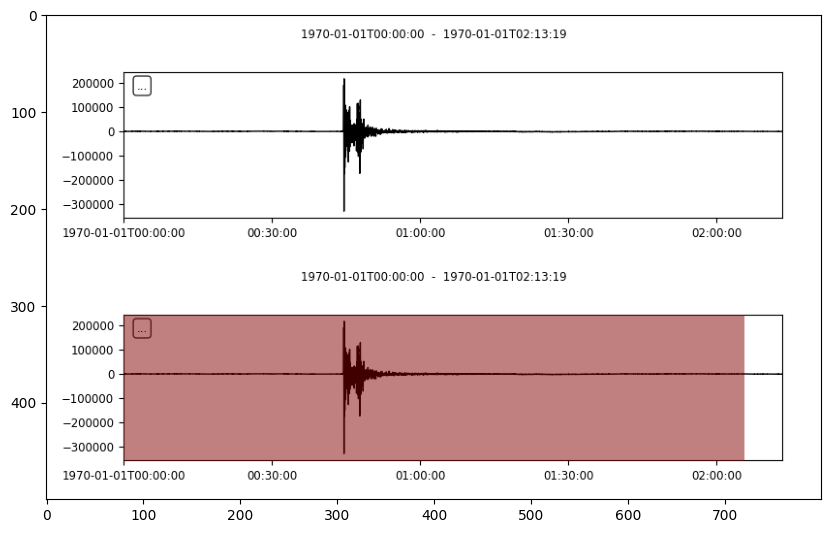

40 : dataset8k_v4/class8/original/201911_3_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


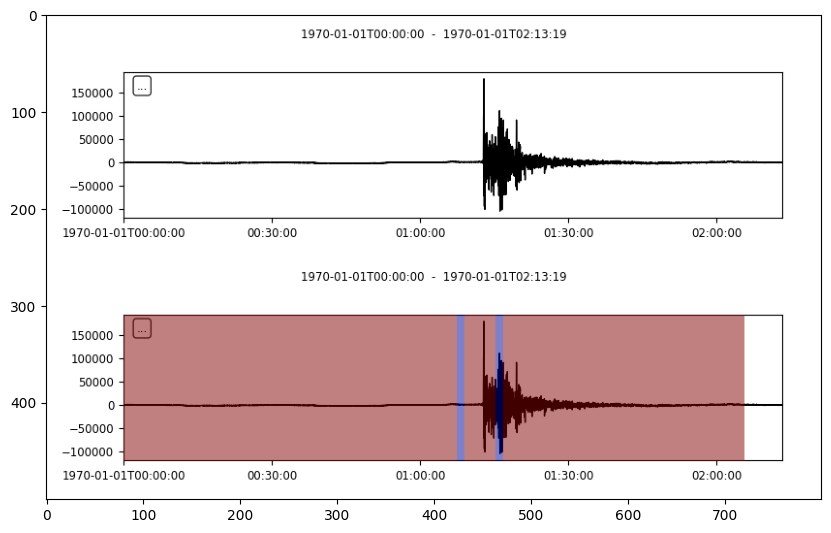

41 : dataset8k_v4/class8/original/201911_5_5__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 24ms/step


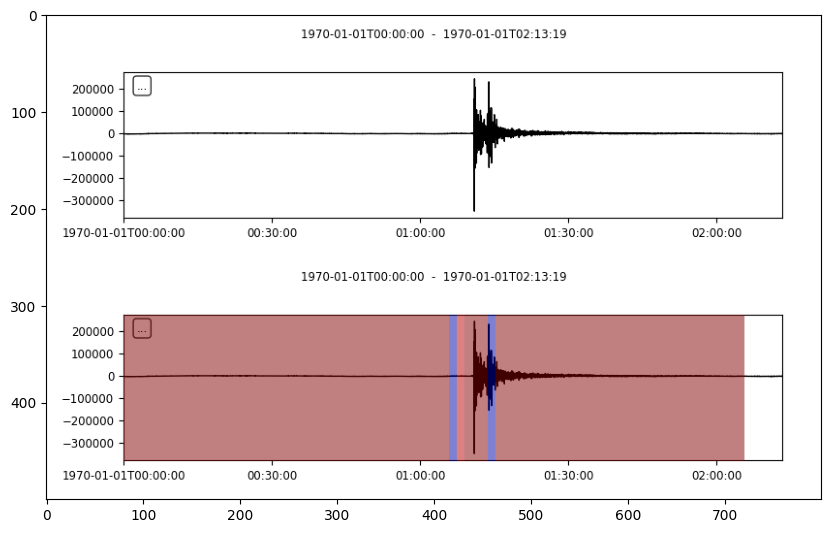

42 : dataset8k_v4/class8/original/201912_11_0__BALB.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


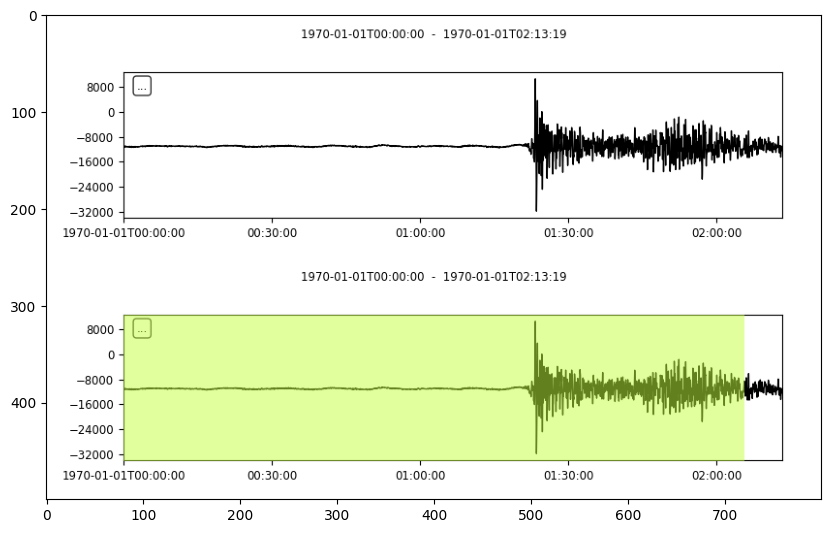

43 : dataset8k_v4/class8/original/201912_11_143__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


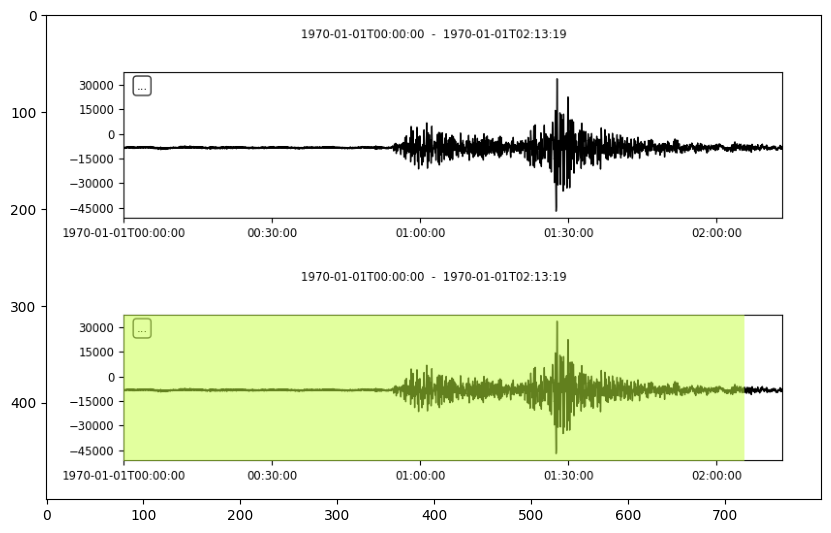

44 : dataset8k_v4/class8/original/201912_11_36__KULA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


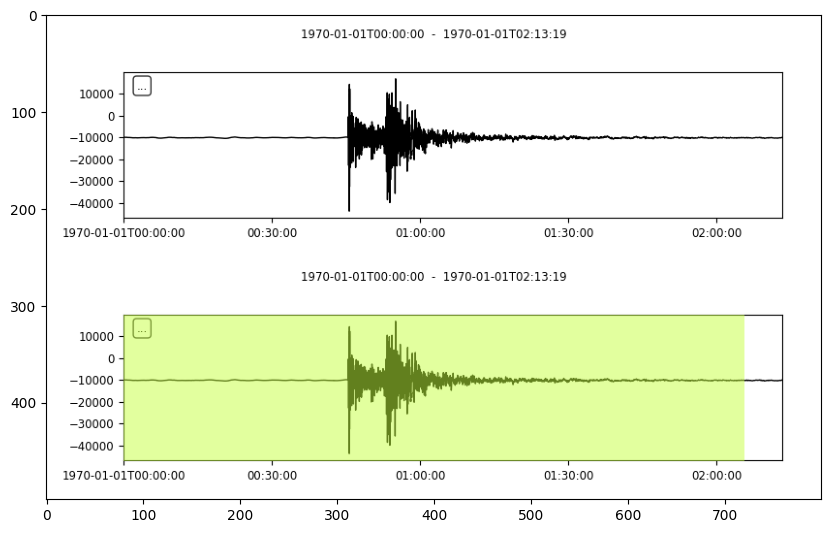

45 : dataset8k_v4/class8/original/201912_11_8__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


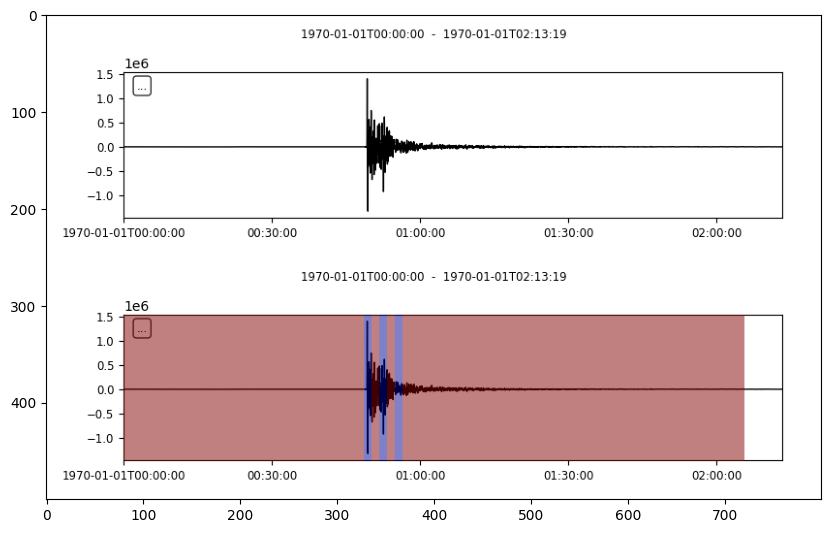

saved 10 files
46 : dataset8k_v4/class8/original/202001_0_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


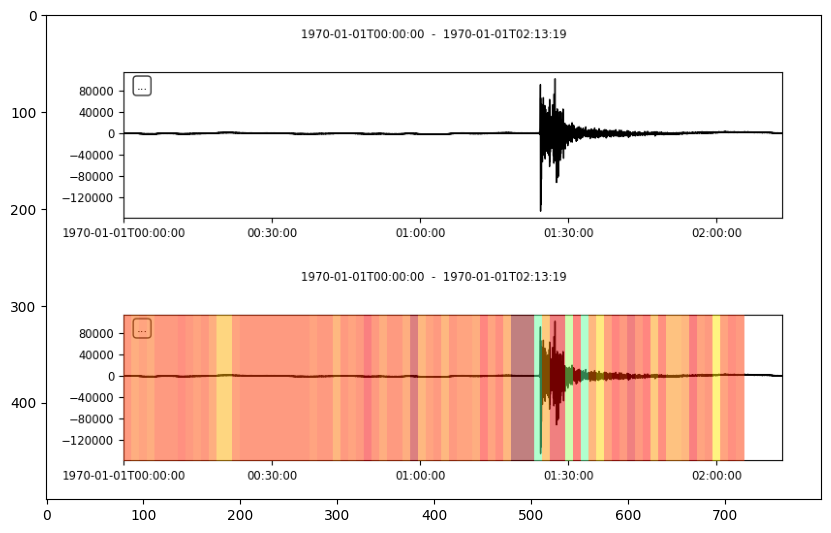

saved 11 files
47 : dataset8k_v4/class8/original/202001_10_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


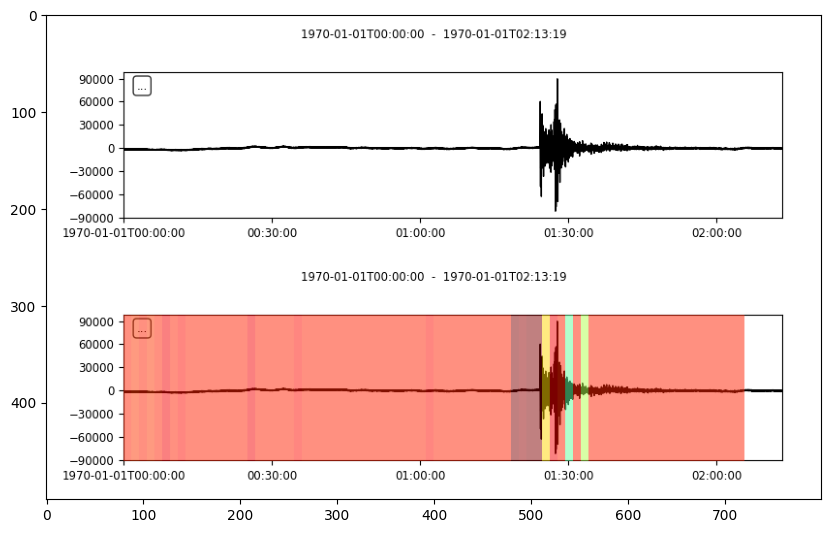

saved 12 files
48 : dataset8k_v4/class8/original/202001_7_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


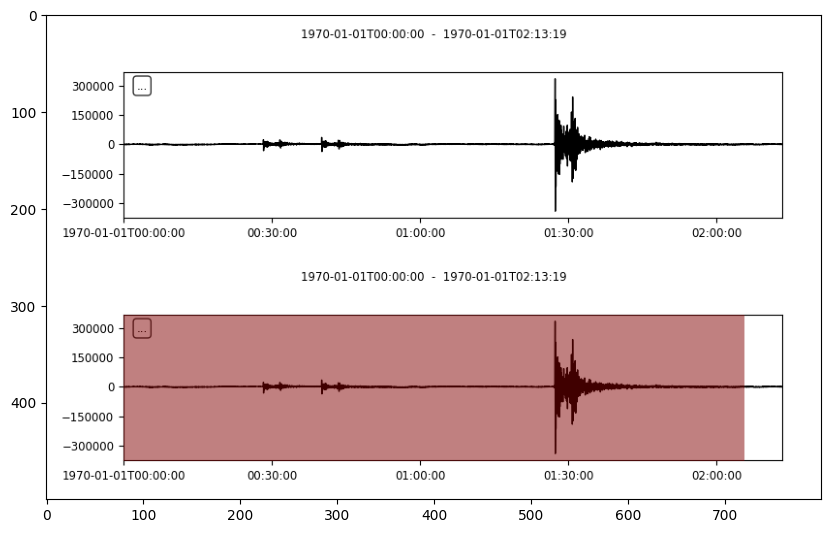

49 : dataset8k_v4/class8/original/202002_0_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


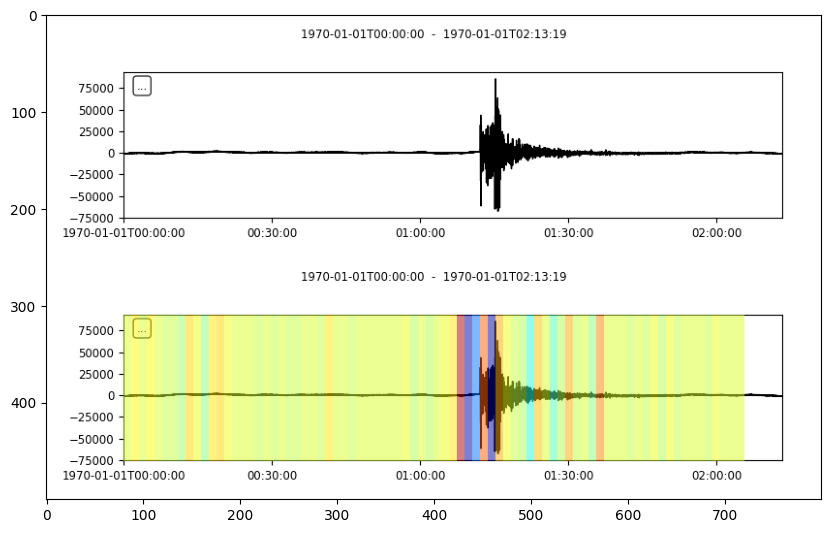

saved 13 files
50 : dataset8k_v4/class8/original/202002_15_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


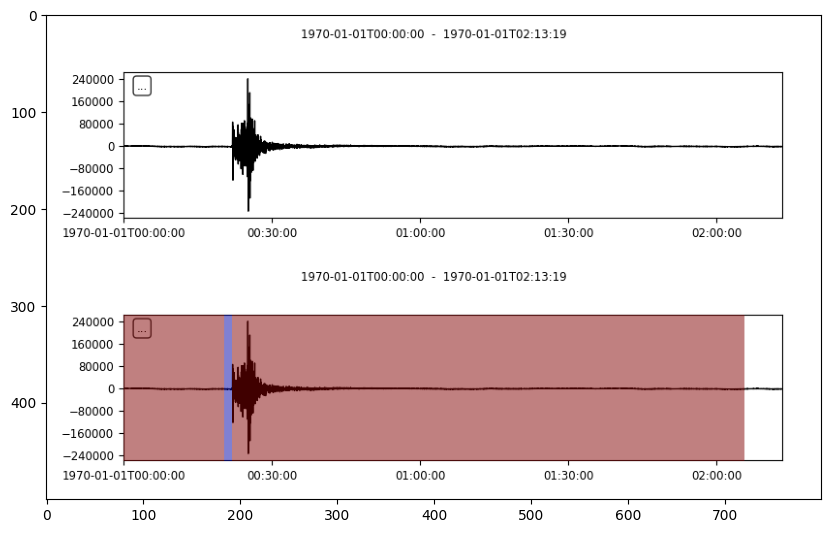

51 : dataset8k_v4/class8/original/202002_17_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


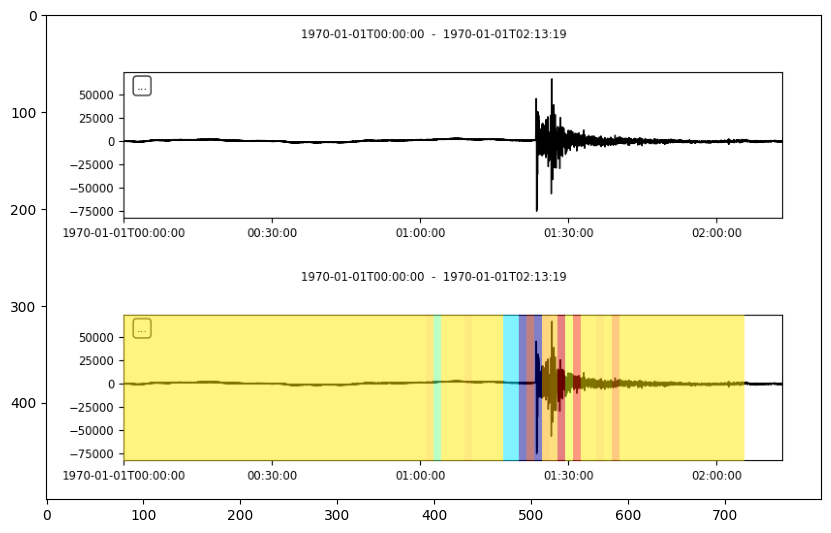

saved 14 files
52 : dataset8k_v4/class8/original/202002_1_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


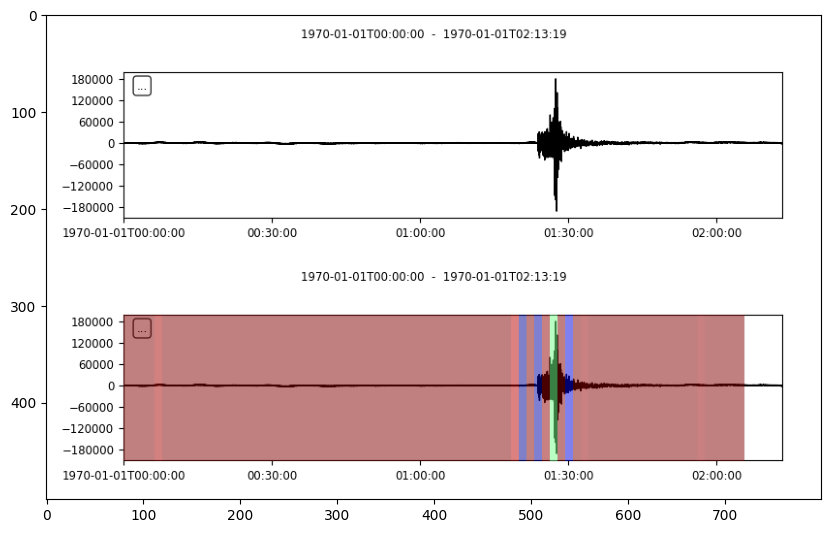

53 : dataset8k_v4/class8/original/202002_23_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


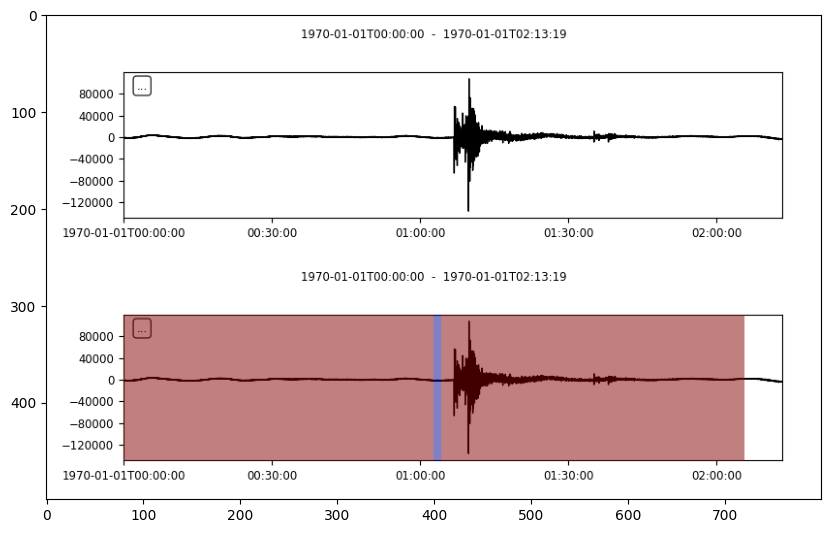

54 : dataset8k_v4/class8/original/202002_3_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


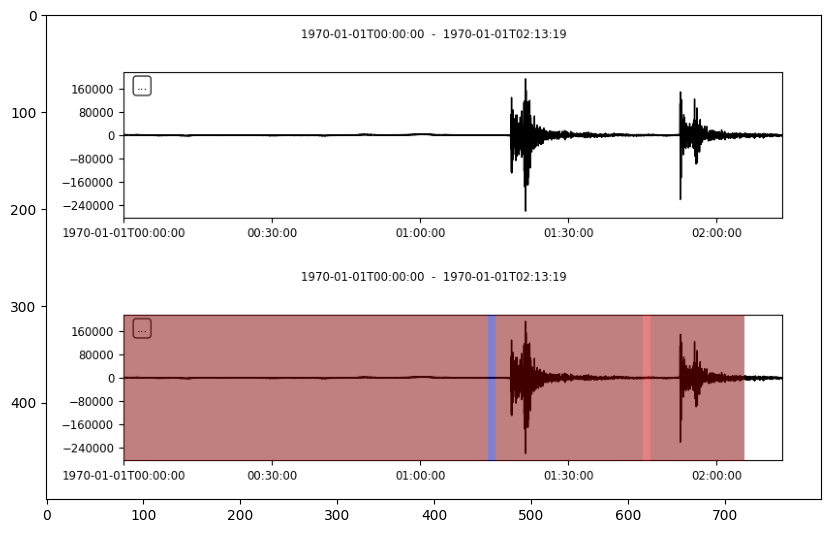

55 : dataset8k_v4/class8/original/202002_7_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


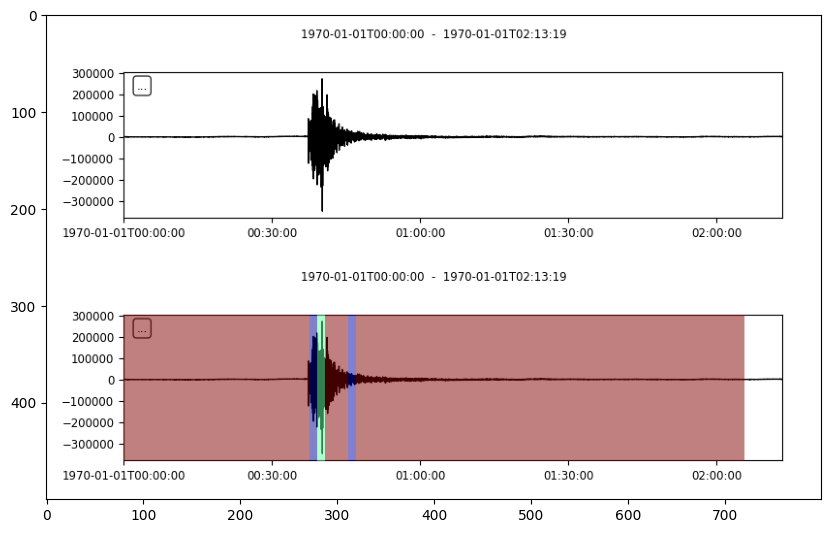

56 : dataset8k_v4/class8/original/202003_19_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


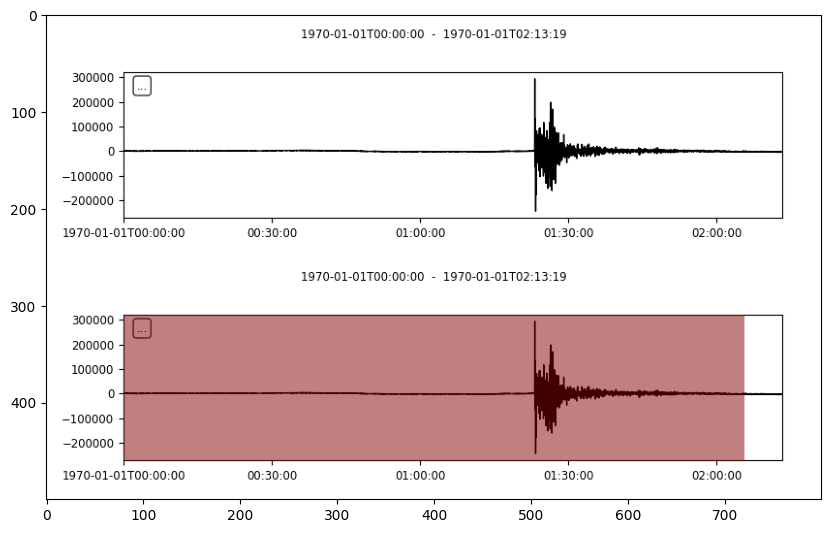

57 : dataset8k_v4/class8/original/202003_19_44__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


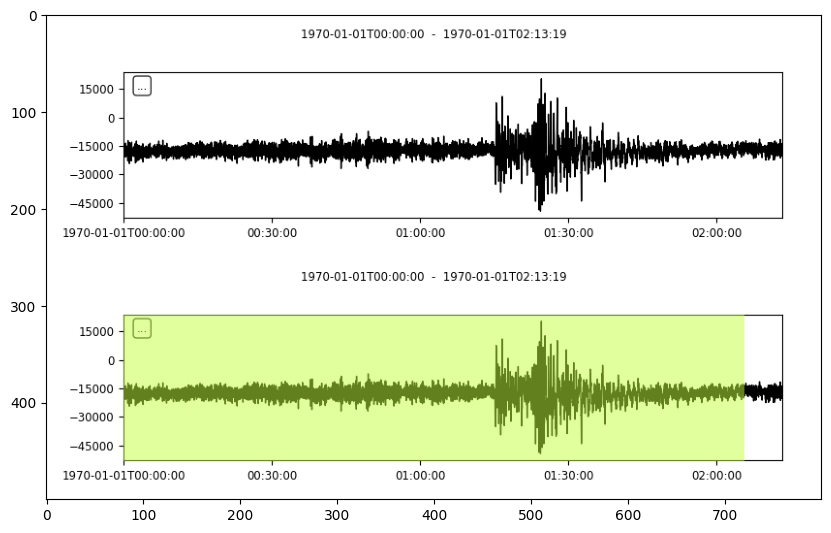

58 : dataset8k_v4/class8/original/202003_3_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


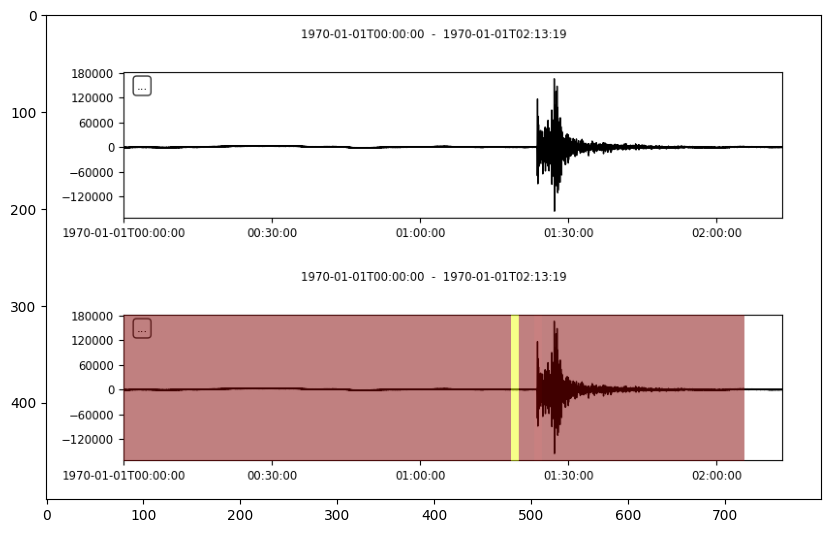

59 : dataset8k_v4/class8/original/202004_11_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


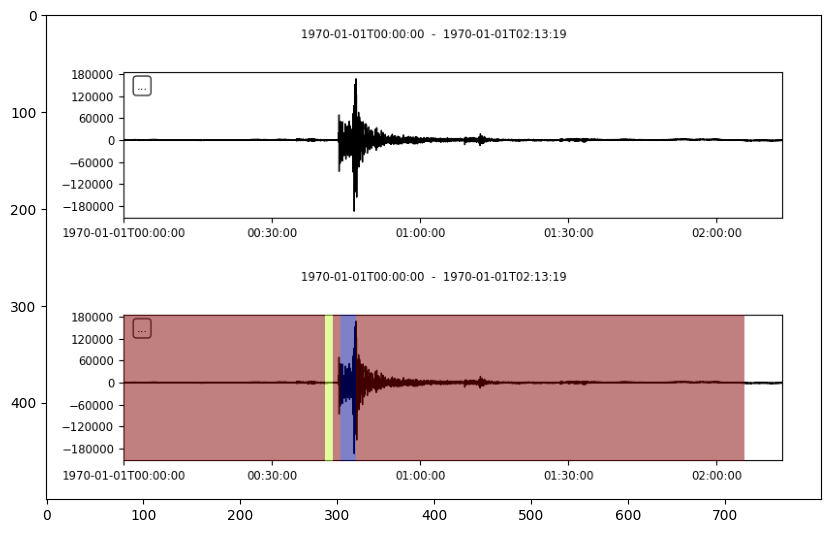

60 : dataset8k_v4/class8/original/202004_12_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


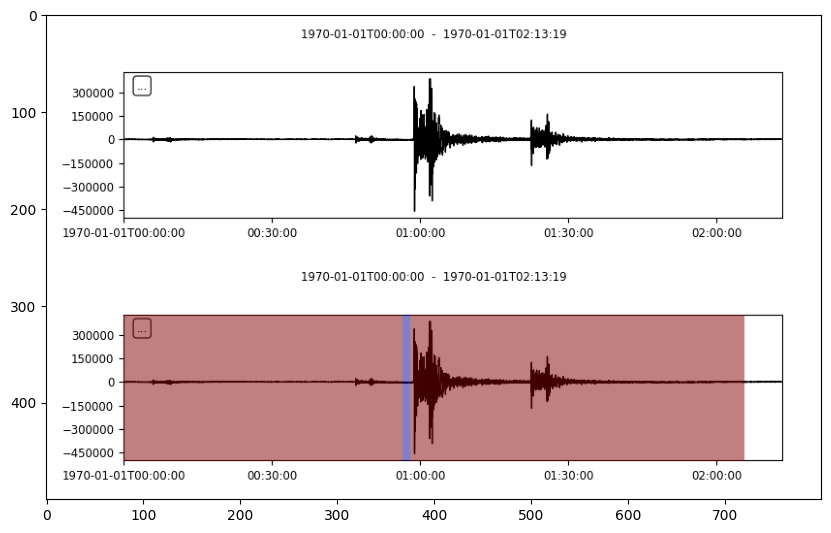

61 : dataset8k_v4/class8/original/202004_13_6__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 23ms/step


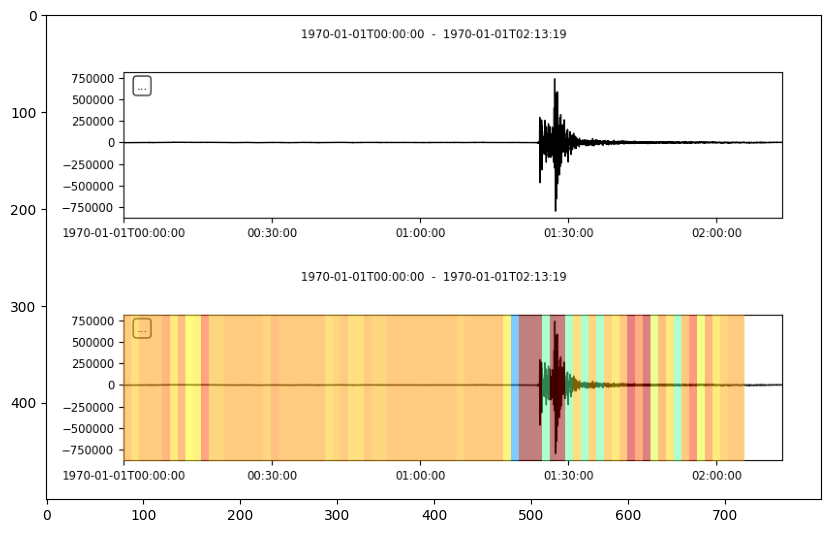

saved 15 files
62 : dataset8k_v4/class8/original/202004_17_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


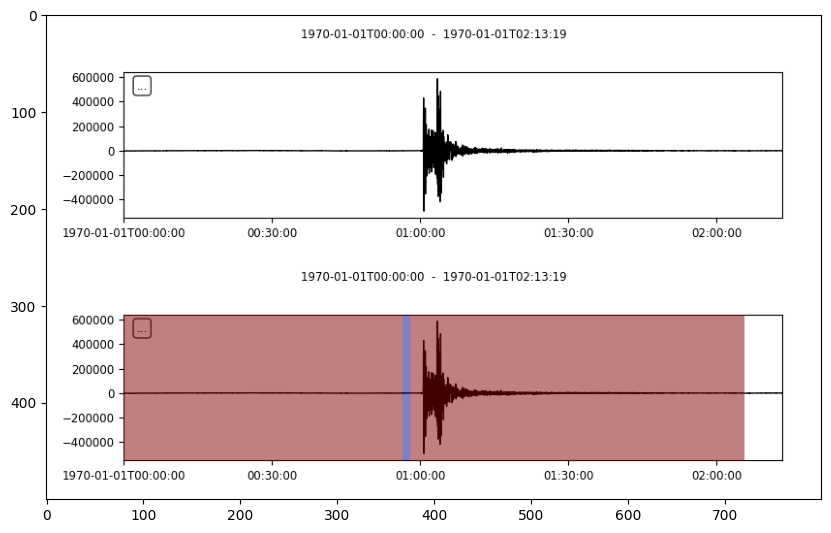

63 : dataset8k_v4/class8/original/202004_1_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


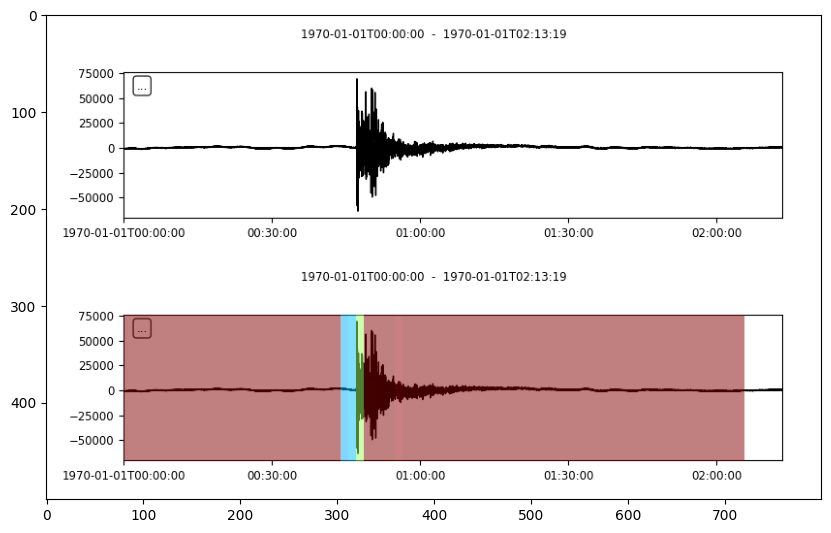

64 : dataset8k_v4/class8/original/202004_20_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


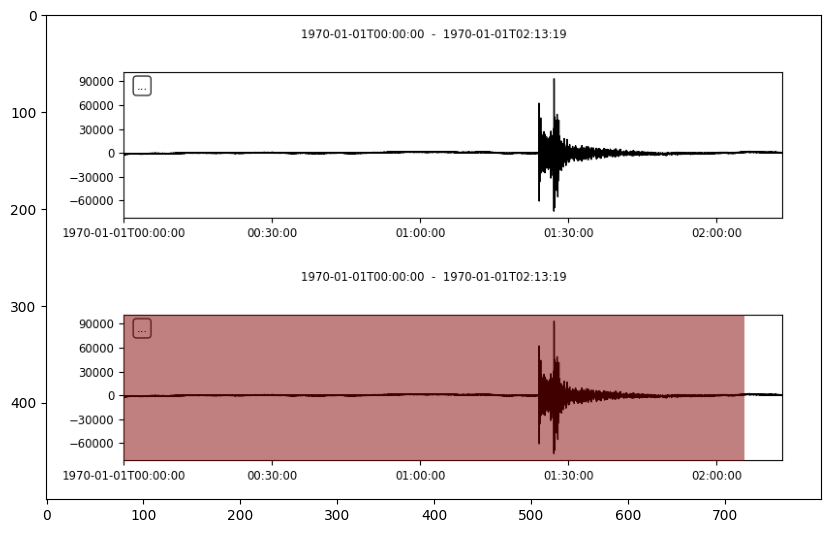

65 : dataset8k_v4/class8/original/202004_7_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


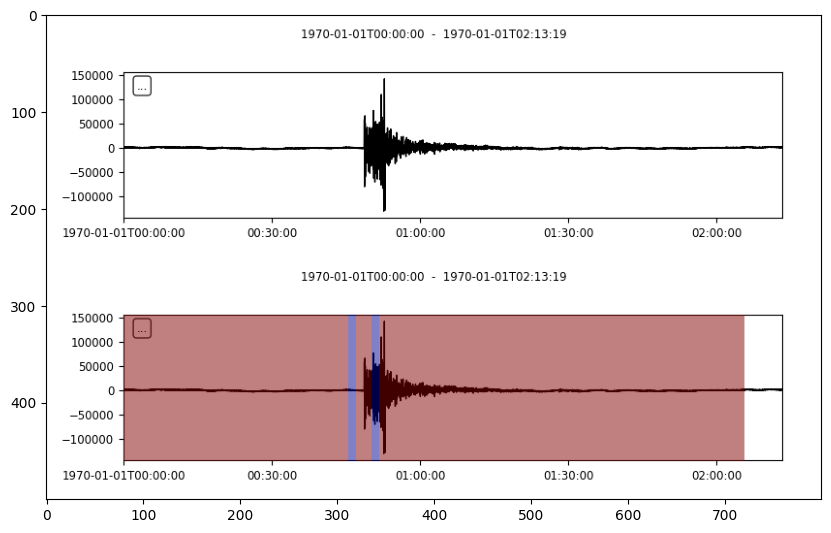

66 : dataset8k_v4/class8/original/202005_13_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


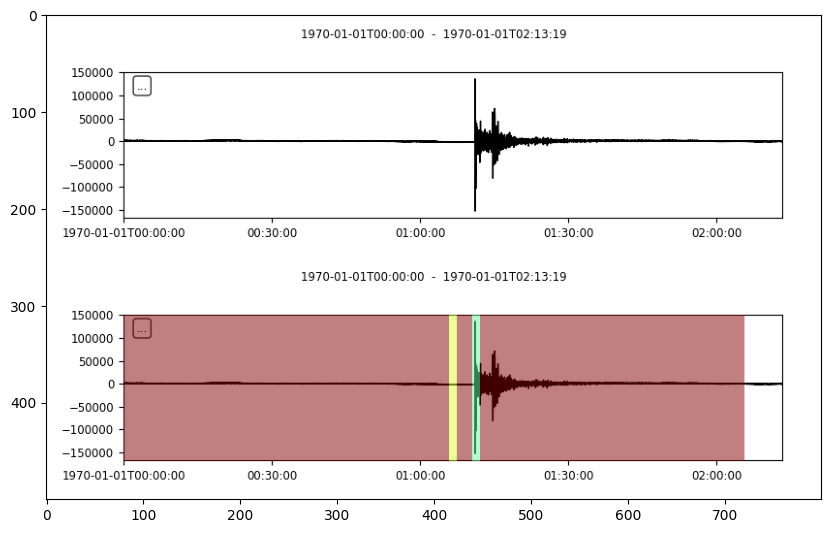

67 : dataset8k_v4/class8/original/202005_14_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


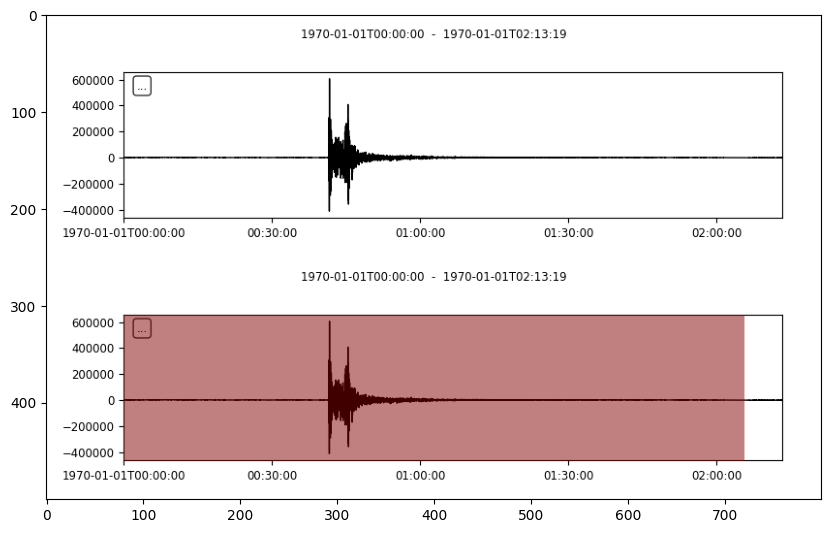

68 : dataset8k_v4/class8/original/202005_18_5__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


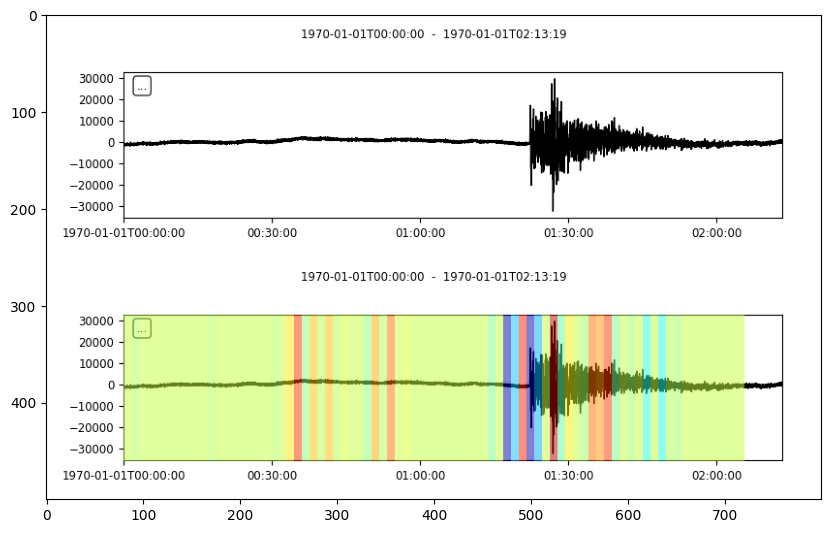

saved 16 files
69 : dataset8k_v4/class8/original/202005_1_14__KULA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


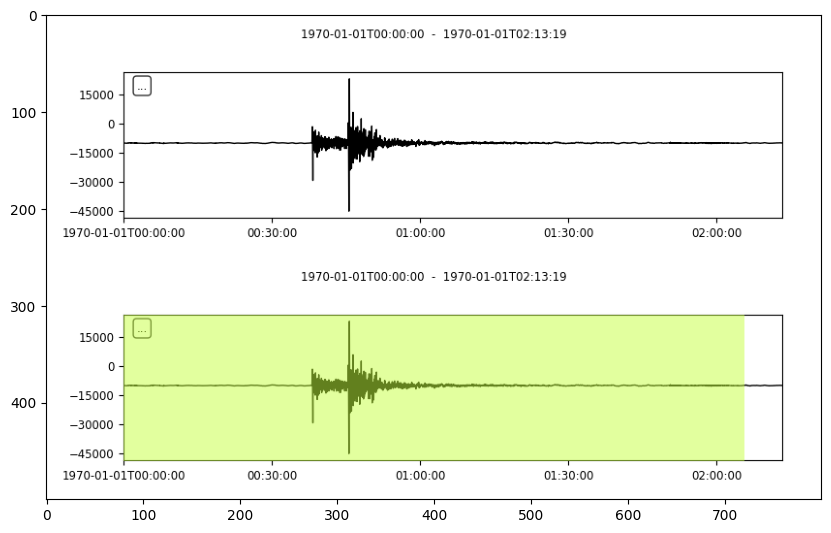

70 : dataset8k_v4/class8/original/202005_1_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


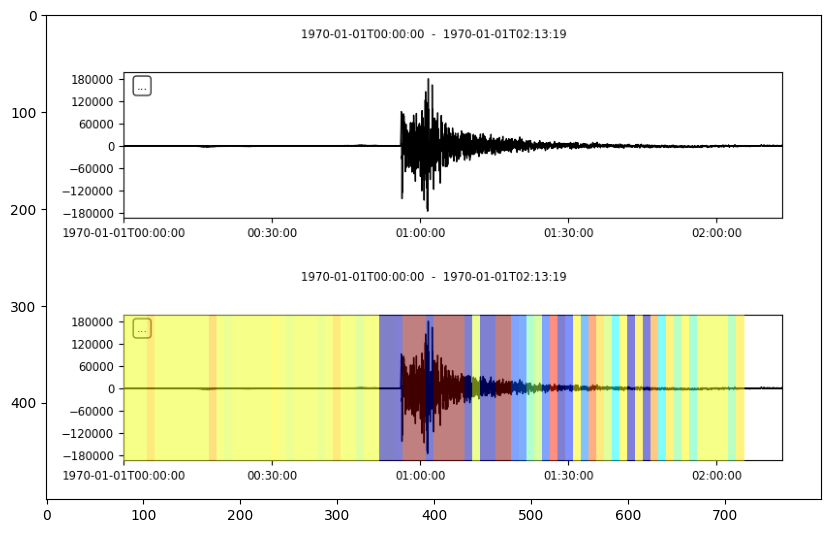

saved 17 files
71 : dataset8k_v4/class8/original/202005_1_44__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


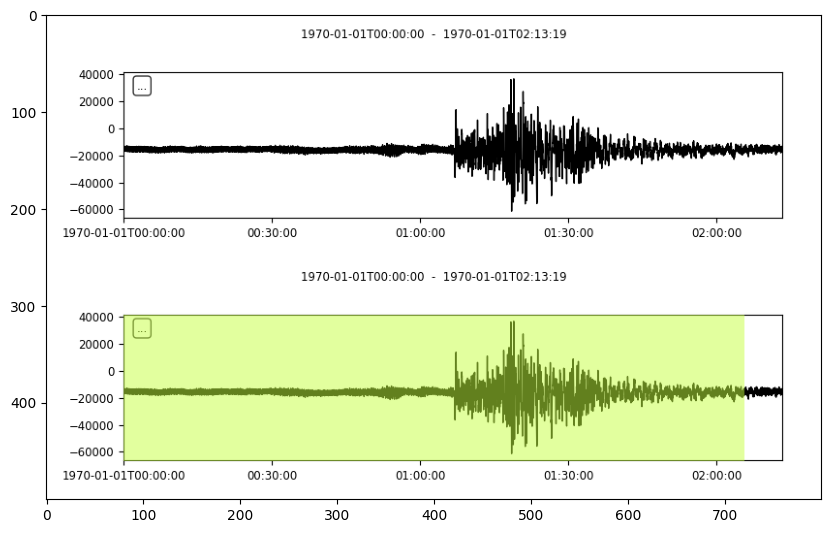

72 : dataset8k_v4/class8/original/202005_20_12__KULA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


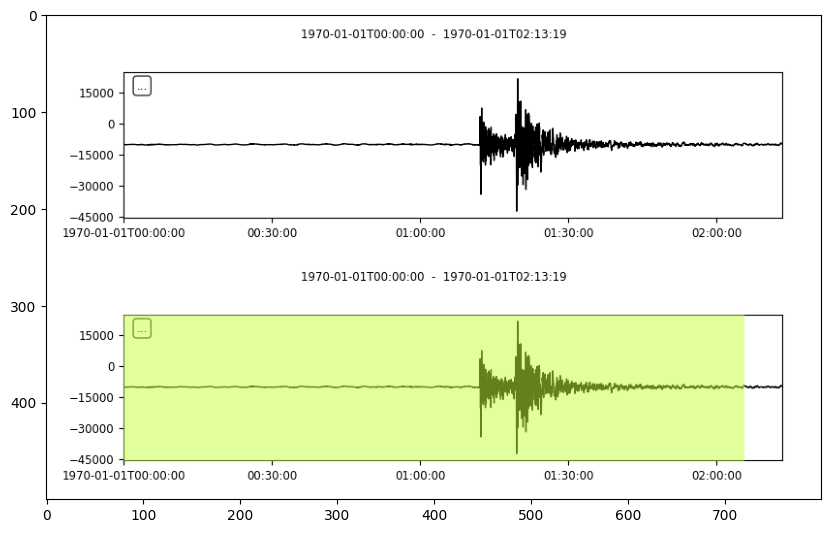

73 : dataset8k_v4/class8/original/202005_20_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


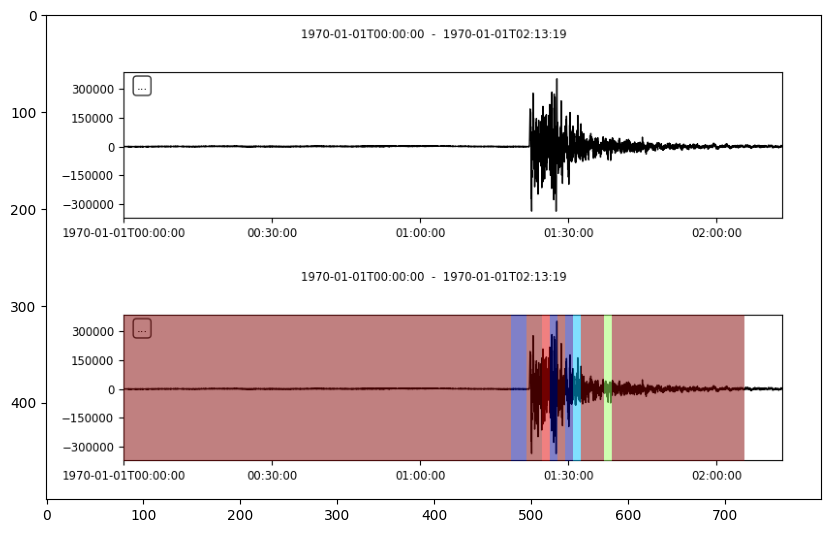

saved 18 files
74 : dataset8k_v4/class8/original/202005_20_42__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


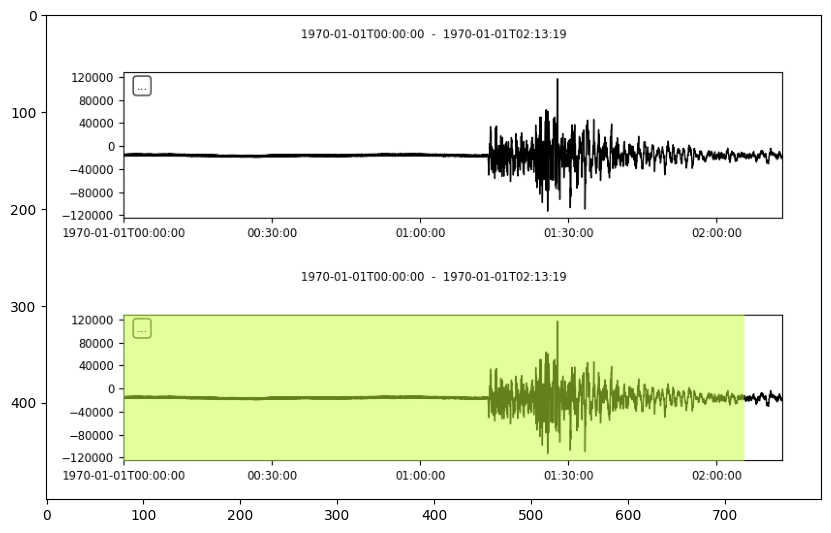

75 : dataset8k_v4/class8/original/202005_20_53__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


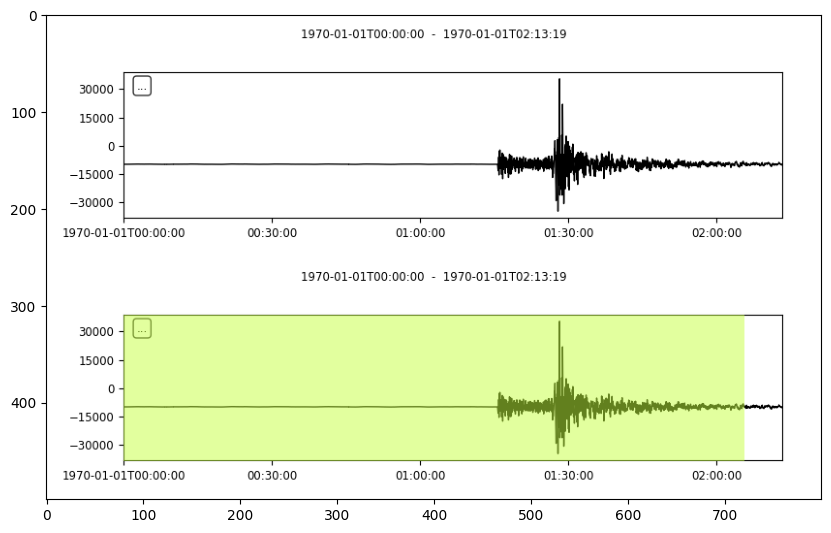

76 : dataset8k_v4/class8/original/202005_20_67__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


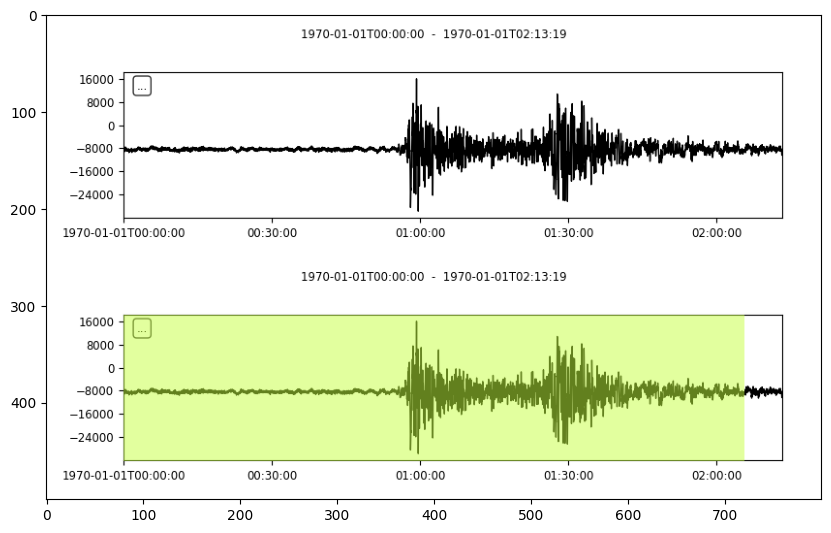

77 : dataset8k_v4/class8/original/202005_22_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


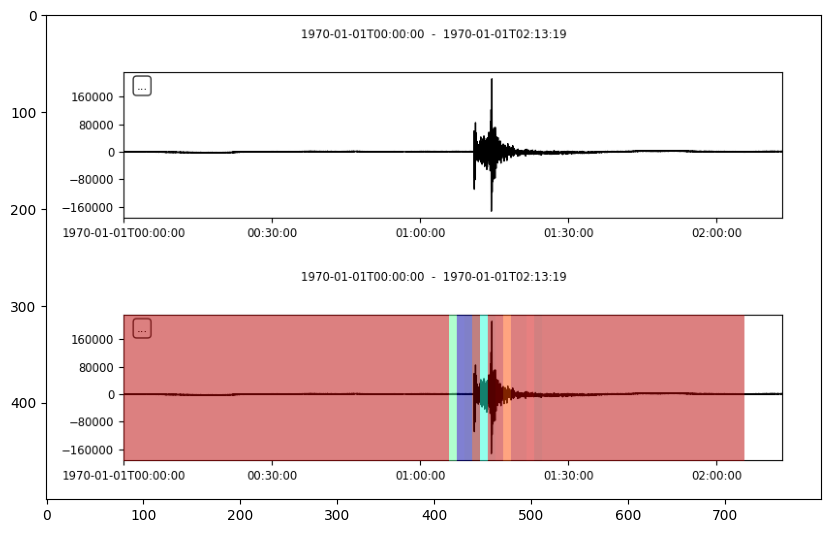

saved 19 files
78 : dataset8k_v4/class8/original/202005_9_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


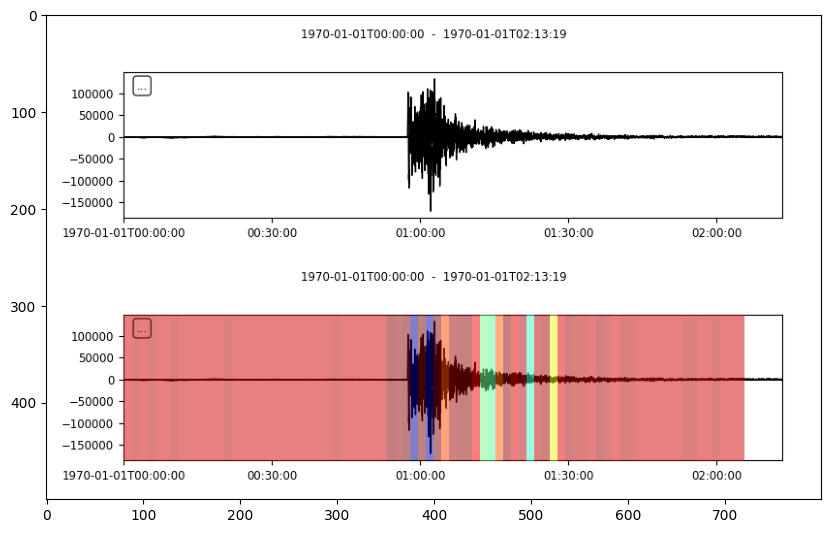

saved 20 files
79 : dataset8k_v4/class8/original/202005_9_47__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


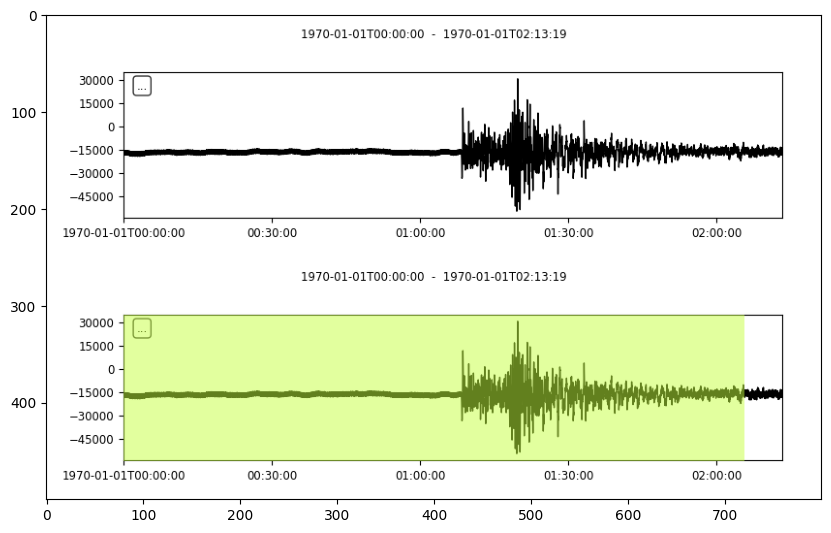

80 : dataset8k_v4/class8/original/202006_2_74__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


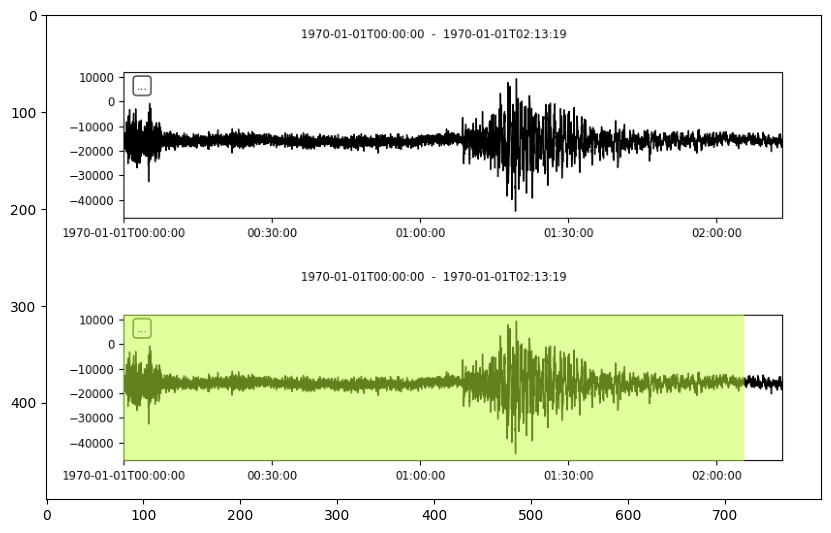

81 : dataset8k_v4/class8/original/202006_2_7__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


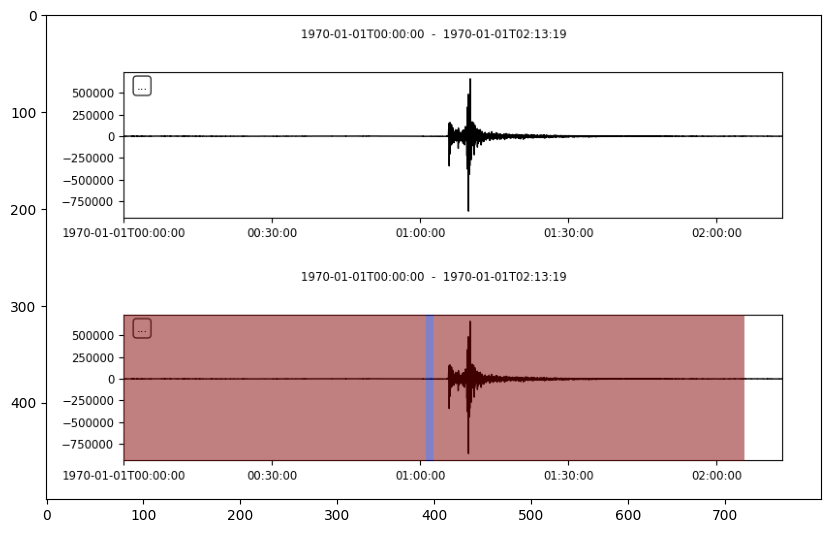

82 : dataset8k_v4/class8/original/202008_10_42__KCTX.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


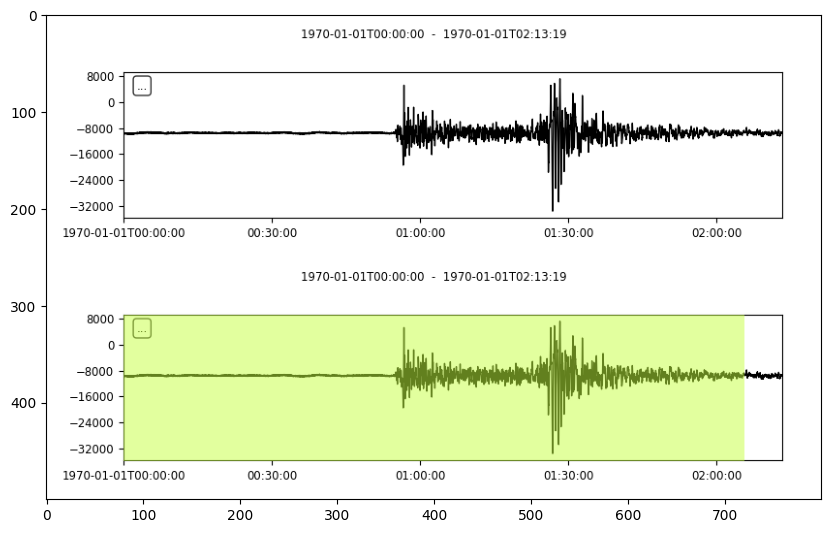

83 : dataset8k_v4/class8/original/202008_10_49__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


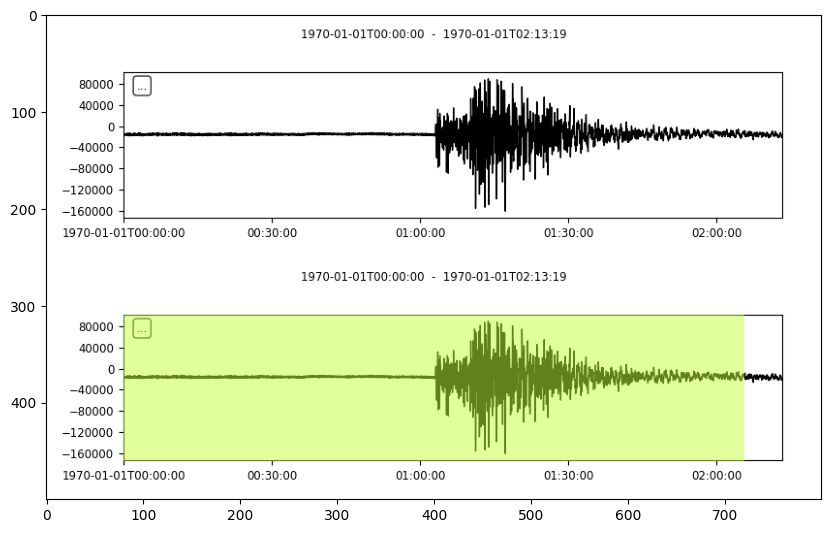

84 : dataset8k_v4/class8/original/202008_10_86__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


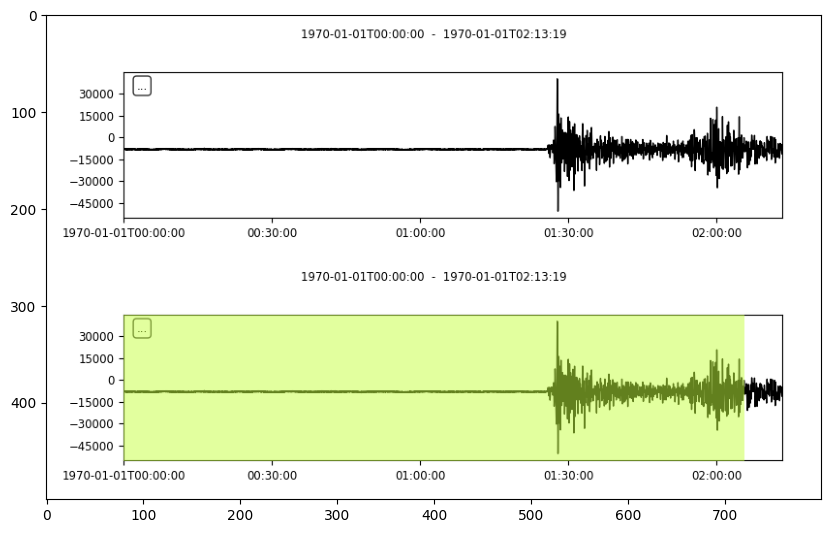

85 : dataset8k_v4/class8/original/202008_20_28__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


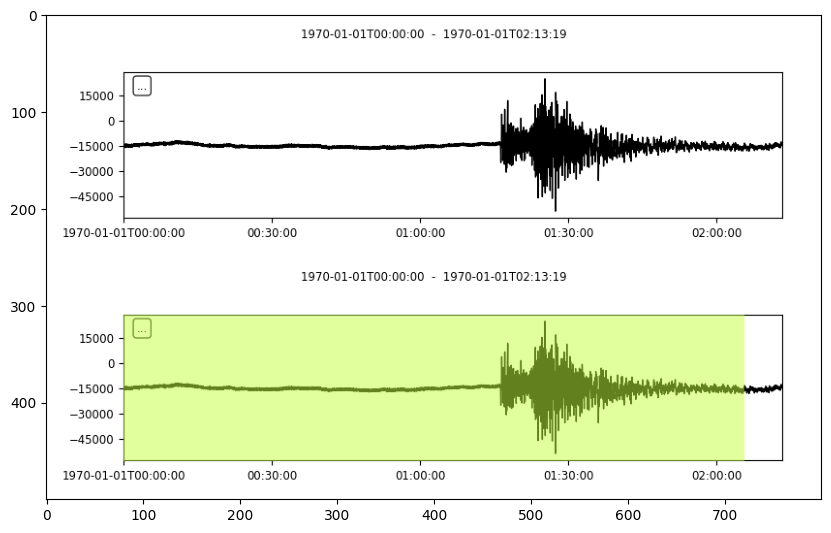

86 : dataset8k_v4/class8/original/202009_14_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


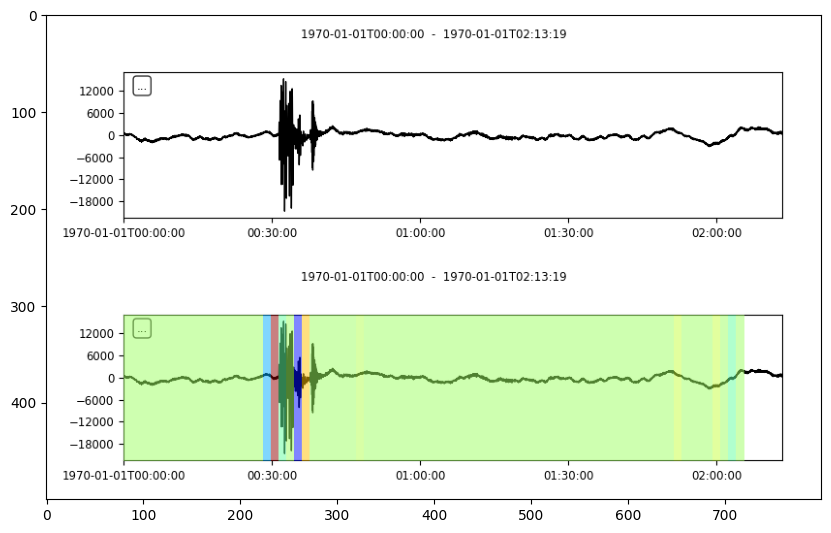

saved 21 files
87 : dataset8k_v4/class8/original/202009_22_5__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


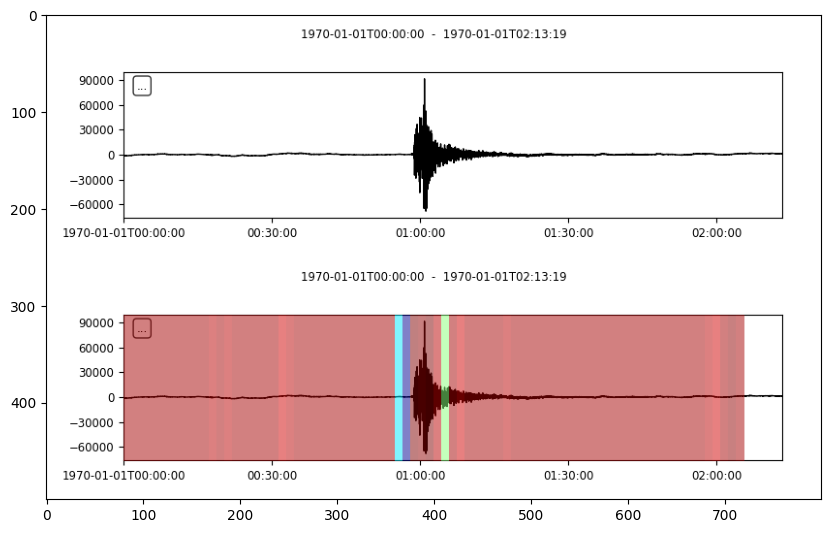

88 : dataset8k_v4/class8/original/202010_15_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


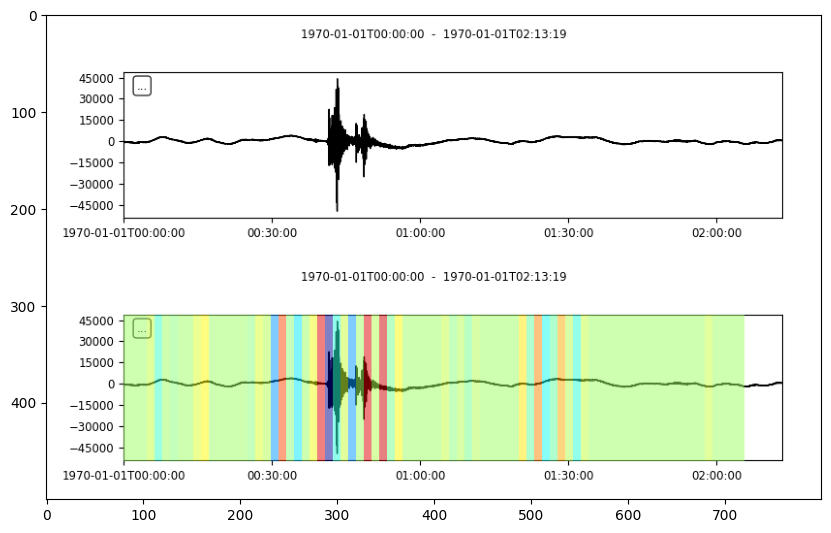

saved 22 files
89 : dataset8k_v4/class8/original/202010_17_0__SIMA.BHZ.KO_original.sac


2023-06-21 20:20:17.057709: I tensorflow/core/common_runtime/executor.cc:1197] [/job:localhost/replica:0/task:0/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: Matrix size-incompatible: In[0]: [1,4384], In[1]: [3984,8]
	 [[{{node sequential/dense/Relu}}]]


InvalidArgumentError: Graph execution error:

Detected at node 'sequential/dense/Relu' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "/usr/lib/python3.10/asyncio/base_events.py", line 600, in run_forever
      self._run_once()
    File "/usr/lib/python3.10/asyncio/base_events.py", line 1896, in _run_once
      handle._run()
    File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 2961, in run_cell
      result = self._run_cell(
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3016, in _run_cell
      result = runner(coro)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3221, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3400, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3460, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_242912/4110496687.py", line 5, in <module>
      trace, pred, p_l = colorize(path, divide_number = 80)
    File "/tmp/ipykernel_242912/1633683786.py", line 19, in colorize
      t_pred = model.predict(predict_data)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2382, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2169, in predict_function
      return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2155, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2143, in run_step
      outputs = model.predict_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2111, in predict_step
      return self(x, training=False)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 558, in __call__
      return super().__call__(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/base_layer.py", line 1145, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/sequential.py", line 412, in call
      return super().call(inputs, training=training, mask=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/functional.py", line 512, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/functional.py", line 669, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/base_layer.py", line 1145, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/layers/core/dense.py", line 255, in call
      outputs = self.activation(outputs)
    File "/usr/local/lib/python3.10/dist-packages/keras/activations.py", line 317, in relu
      return backend.relu(
    File "/usr/local/lib/python3.10/dist-packages/keras/backend.py", line 5396, in relu
      x = tf.nn.relu(x)
Node: 'sequential/dense/Relu'
Matrix size-incompatible: In[0]: [1,4384], In[1]: [3984,8]
	 [[{{node sequential/dense/Relu}}]] [Op:__inference_predict_function_448960]

In [7]:

for trace_file in original_trace_file_list:
    path = os.path.join(dataset, original_class_folder, trace_file) 
    print(f"{index} : {path}")
    index = index + 1
    trace, pred, p_l = colorize(path, divide_number = 80)
    x = input("Press Enter to continue...")
    if x == 'q':
        break
    elif x == 's':
        # copy the file to another folder
        trace.write("./dataset/" + trace_file, format="SAC")
        cs = cs + 1
        print(f"saved {cs} files")




91 : dataset8k_v4/class8/original/202010_21_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


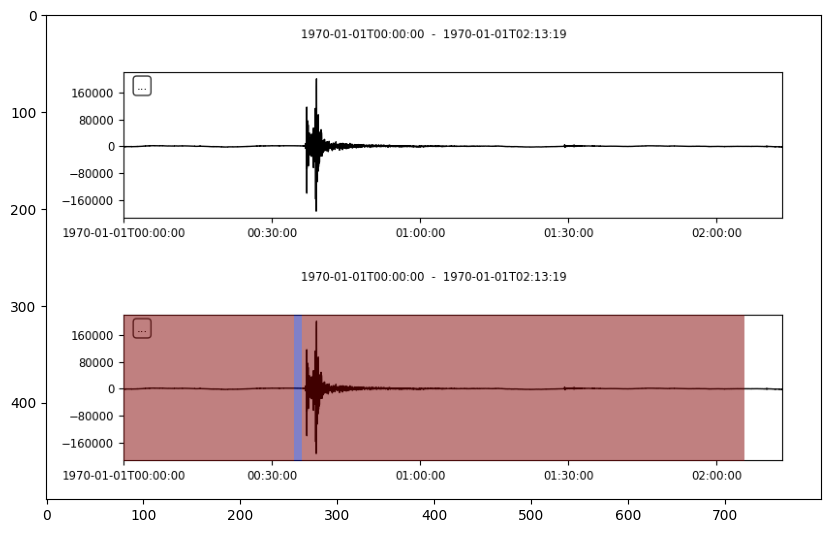

92 : dataset8k_v4/class8/original/202010_22_7__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


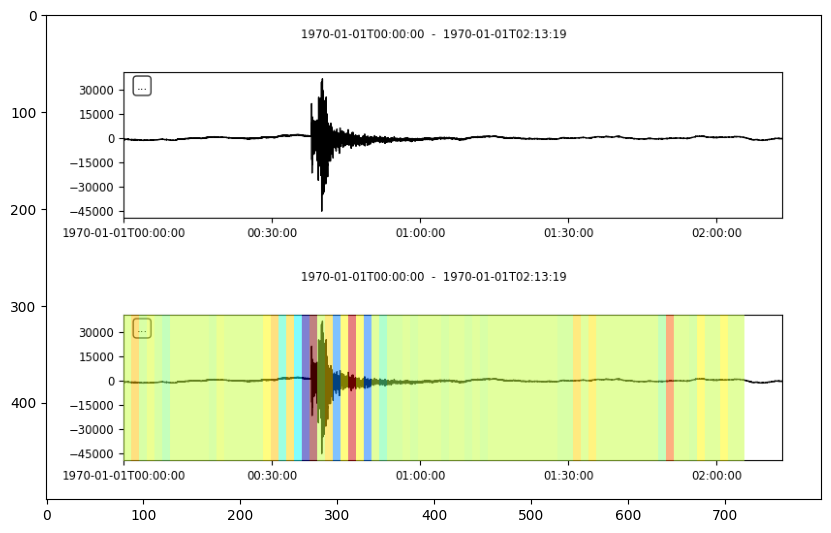

saved 23 files
93 : dataset8k_v4/class8/original/202010_27_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


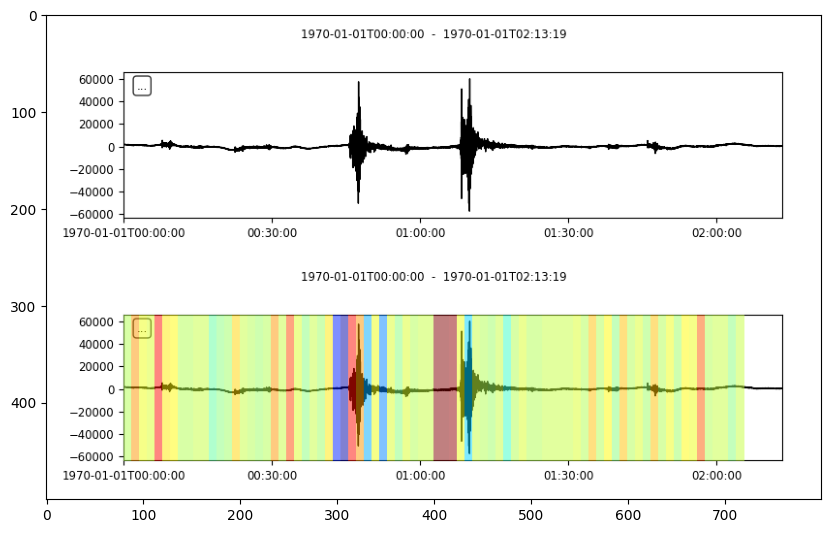

saved 24 files
94 : dataset8k_v4/class8/original/202010_36_74__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


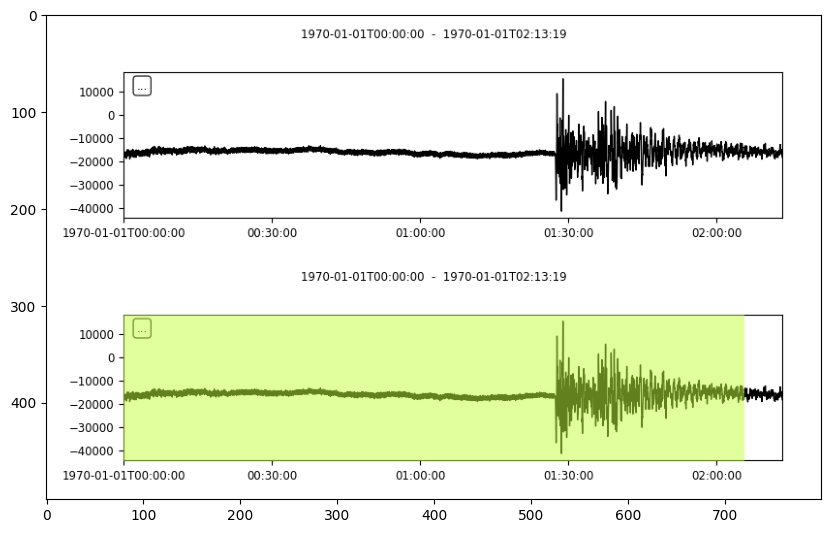

95 : dataset8k_v4/class8/original/202010_36_7__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


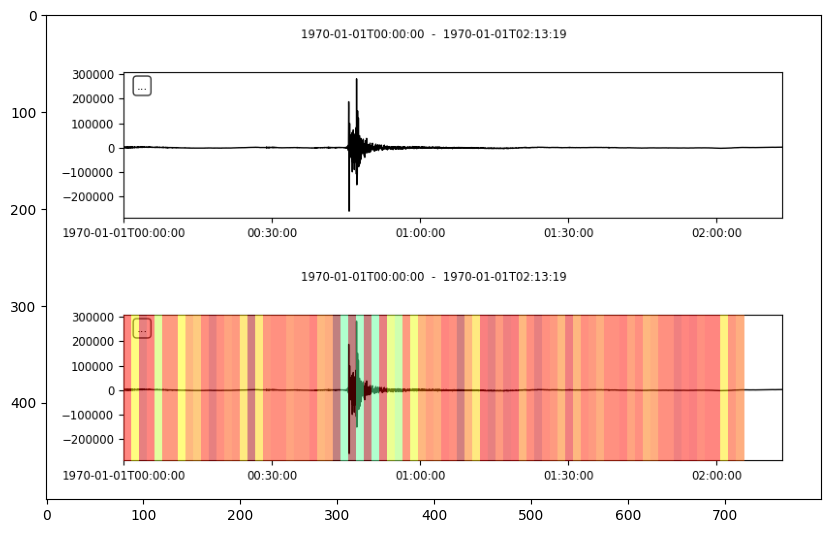

saved 25 files
96 : dataset8k_v4/class8/original/202010_39_8__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


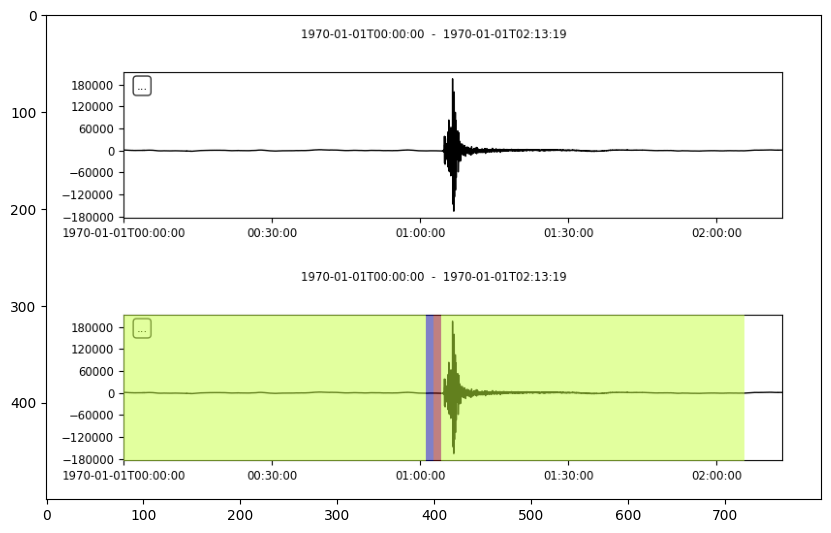

97 : dataset8k_v4/class8/original/202010_40_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


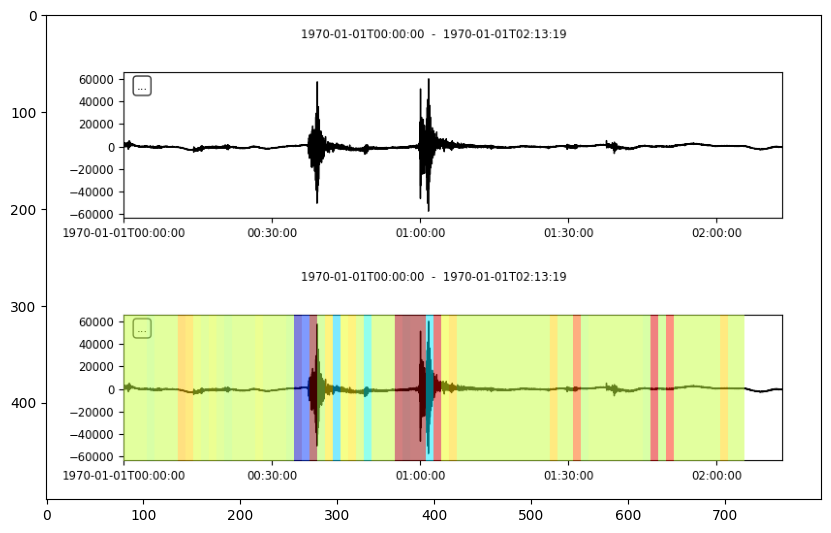

saved 26 files
98 : dataset8k_v4/class8/original/202010_42_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


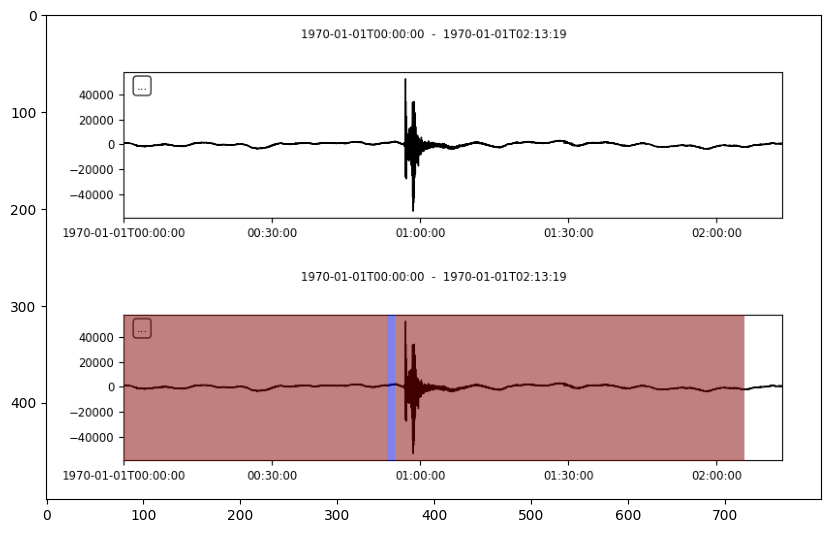

99 : dataset8k_v4/class8/original/202010_5_7__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


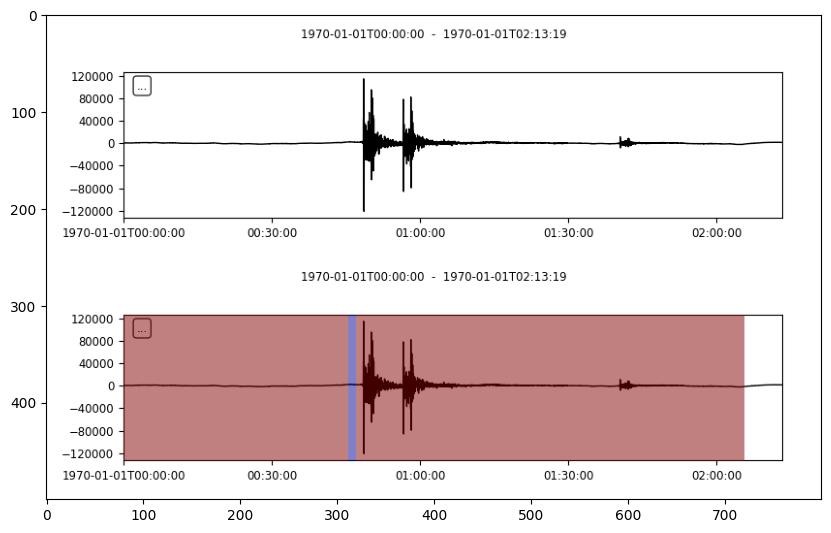

100 : dataset8k_v4/class8/original/202011_6_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


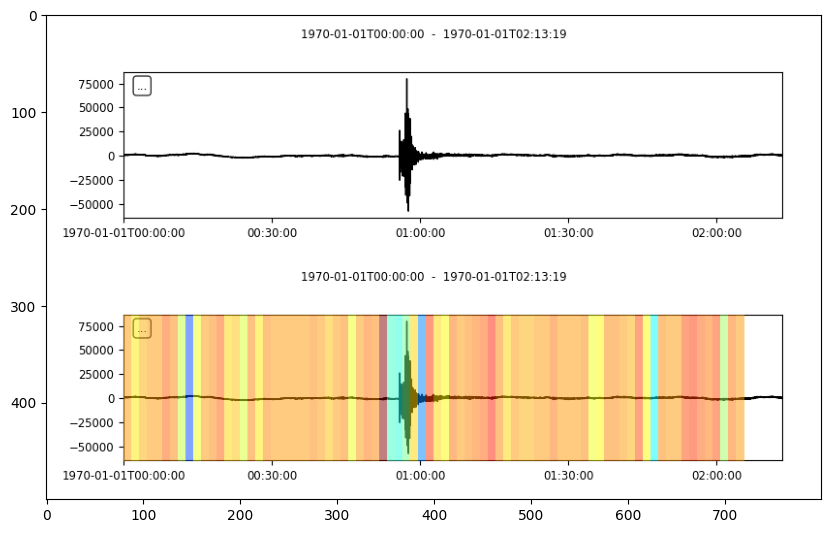

saved 27 files
101 : dataset8k_v4/class8/original/202102_11_13__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


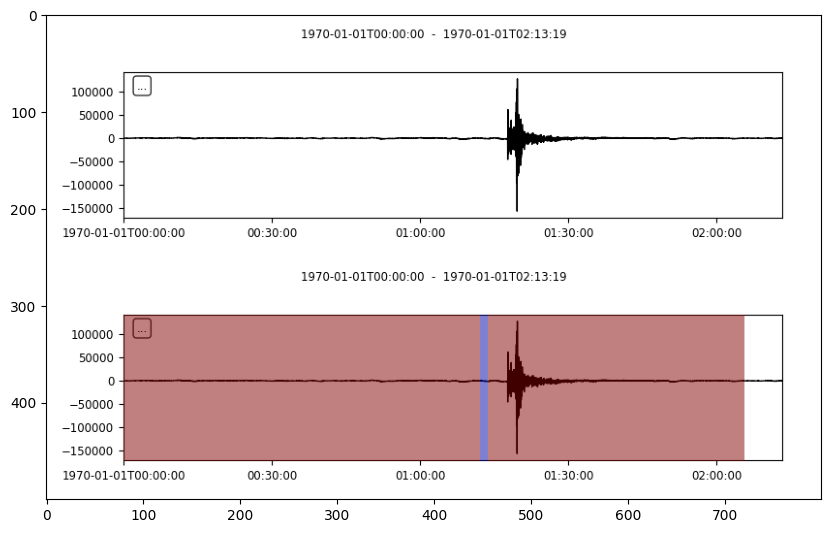

102 : dataset8k_v4/class8/original/202103_9_101__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 17ms/step


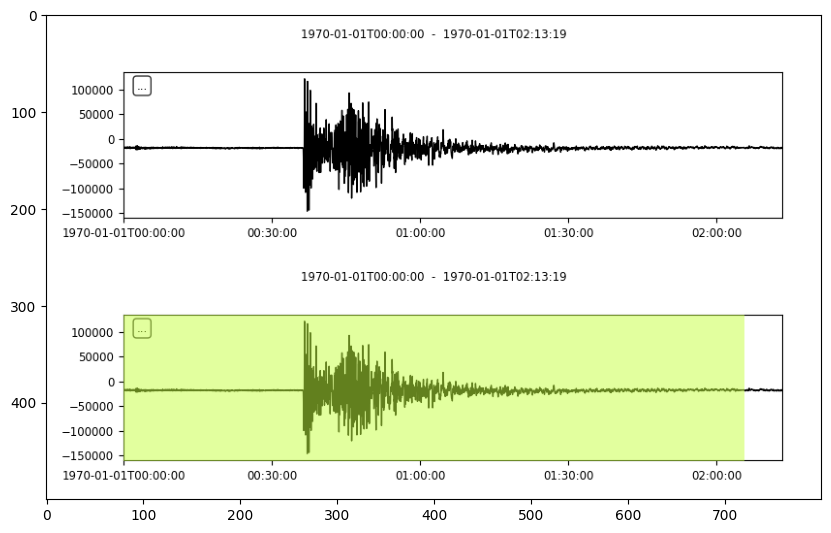

103 : dataset8k_v4/class8/original/202103_9_7__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


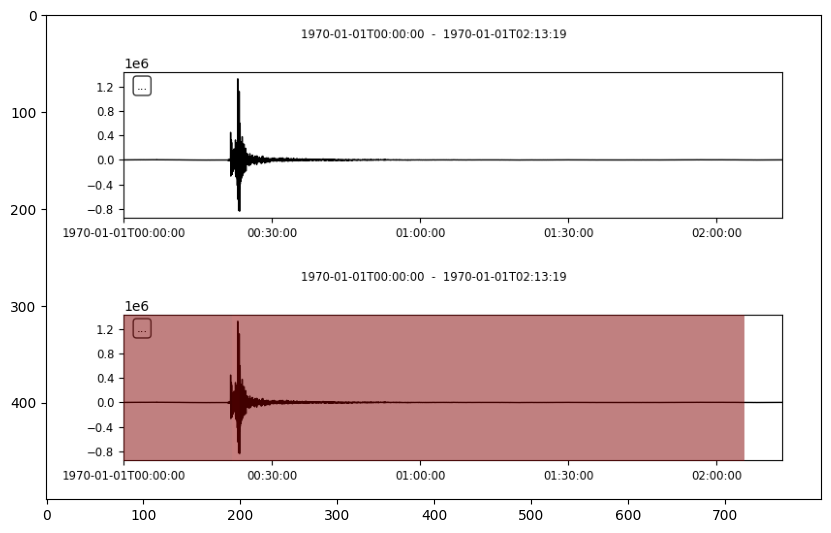

104 : dataset8k_v4/class8/original/202104_1_46__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


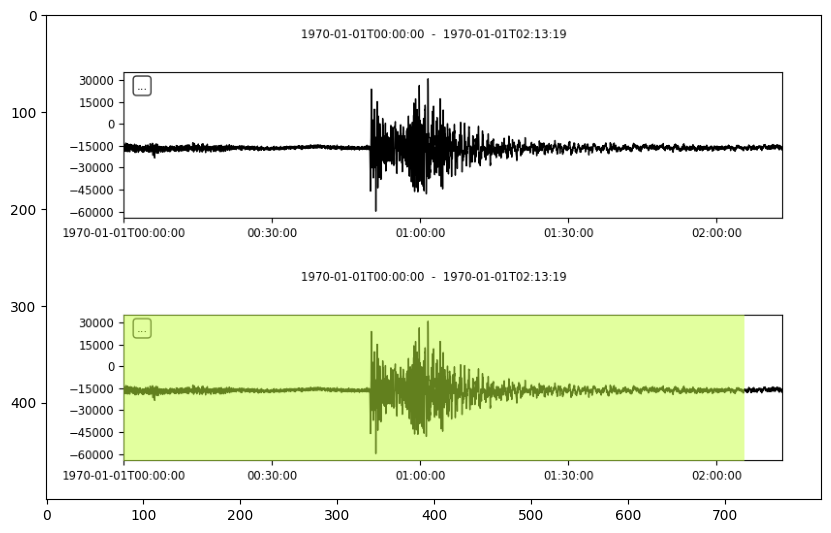

105 : dataset8k_v4/class8/original/202105_10_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


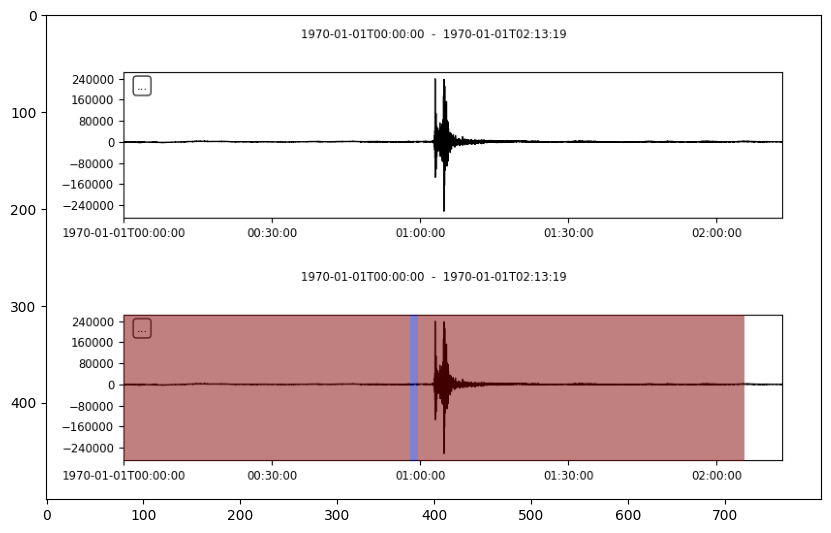

106 : dataset8k_v4/class8/original/202105_16_5__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


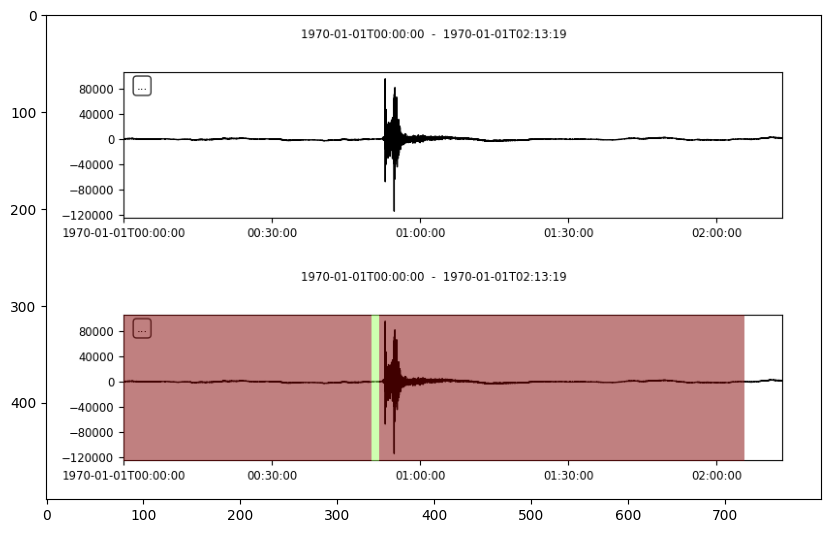

107 : dataset8k_v4/class8/original/202109_7_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


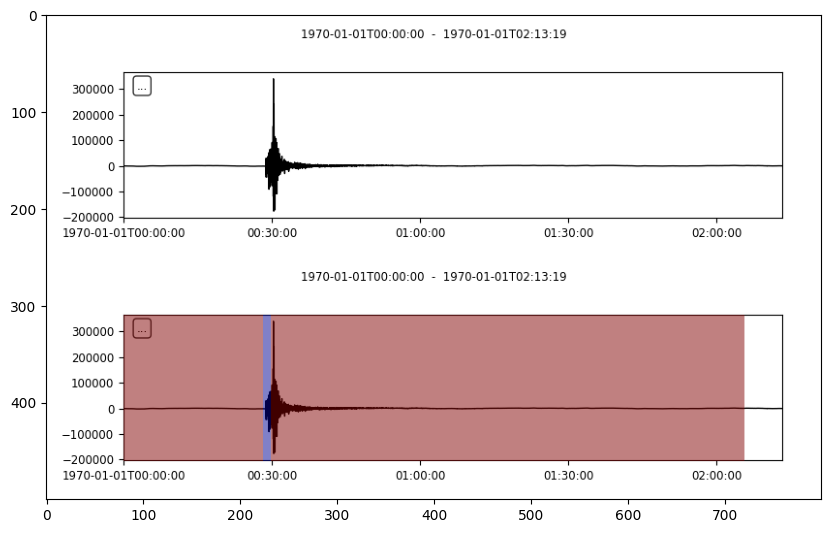

108 : dataset8k_v4/class8/original/202110_7_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 23ms/step


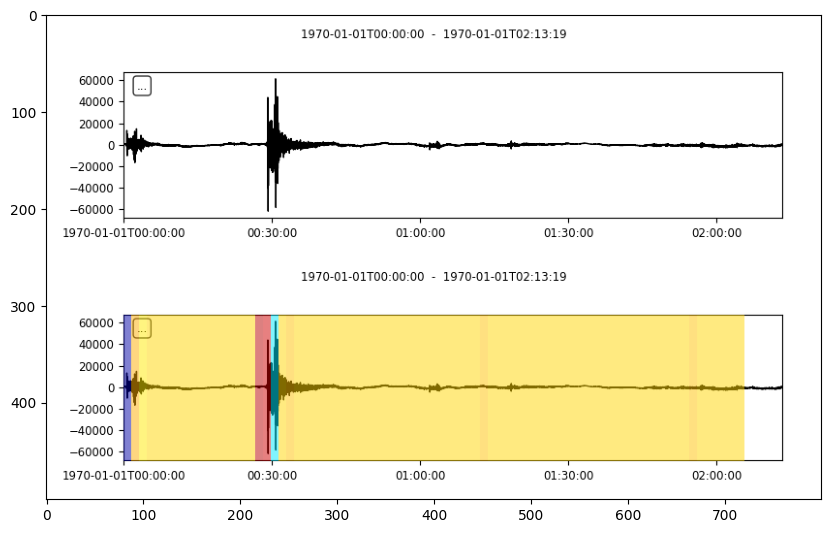

saved 28 files
109 : dataset8k_v4/class8/original/202201_0_98__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


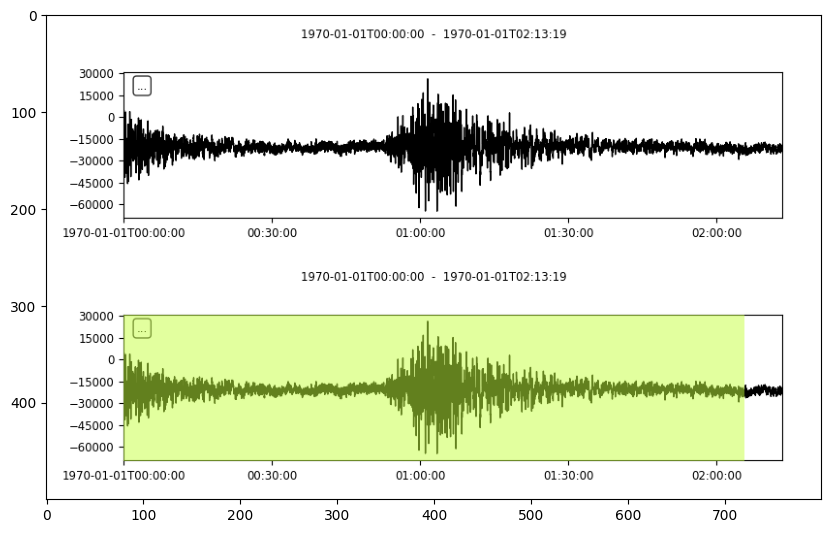

110 : dataset8k_v4/class8/original/202201_0_9__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


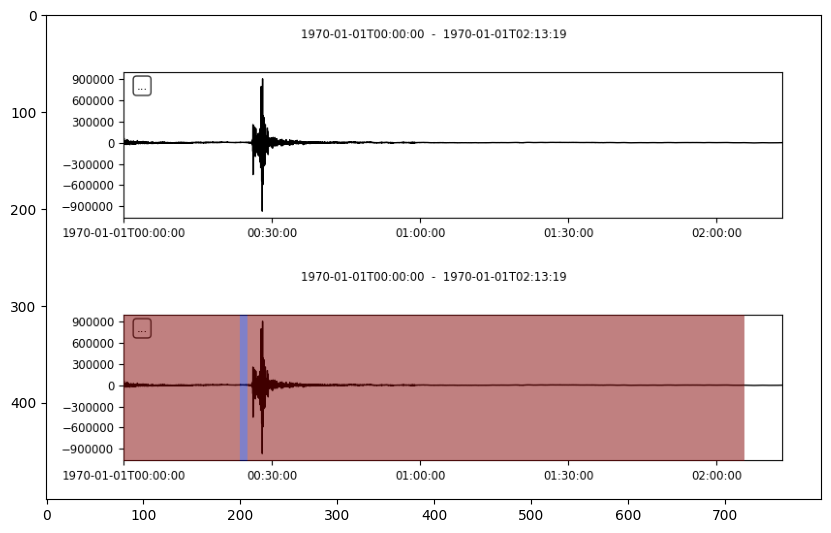

111 : dataset8k_v4/class8/original/202201_10_74__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


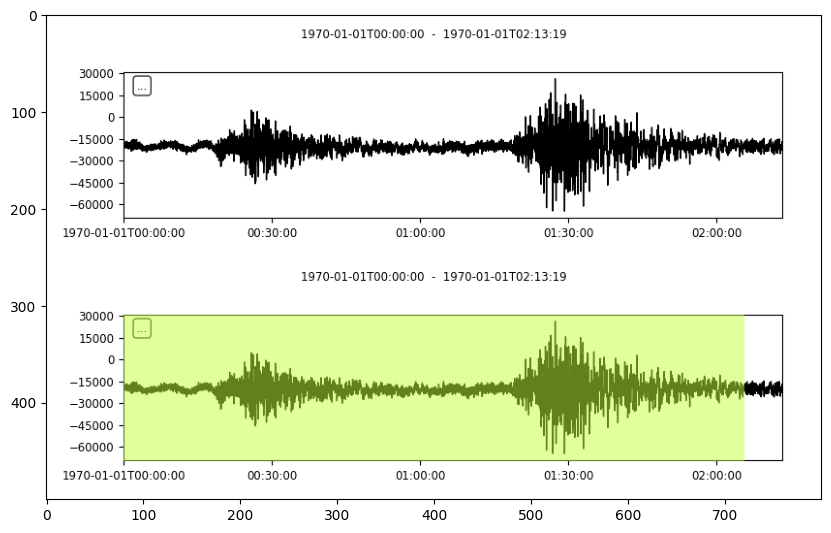

saved 29 files
112 : dataset8k_v4/class8/original/202201_12_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


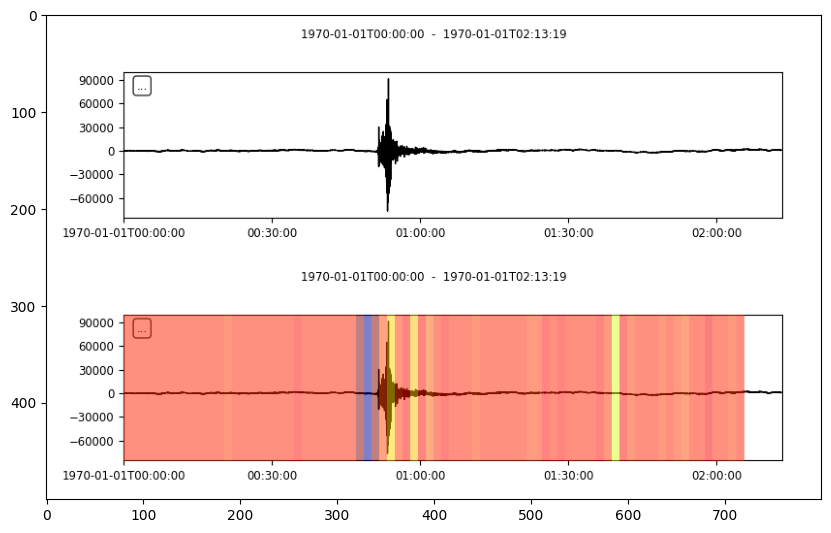

saved 30 files
113 : dataset8k_v4/class8/original/202201_12_45__03_02_22SIMA.BHZ.SAC_original.sac
1/1 [==============================] - 0s 19ms/step


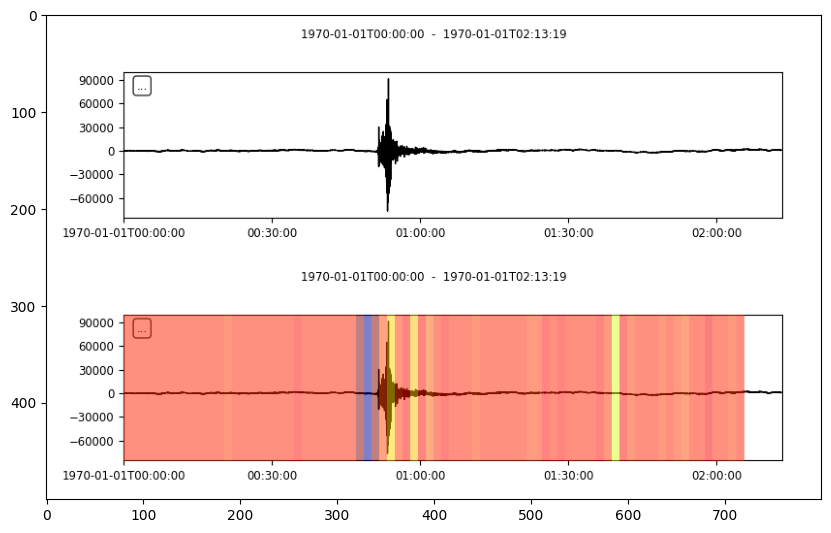

saved 31 files
114 : dataset8k_v4/class8/original/202201_15_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


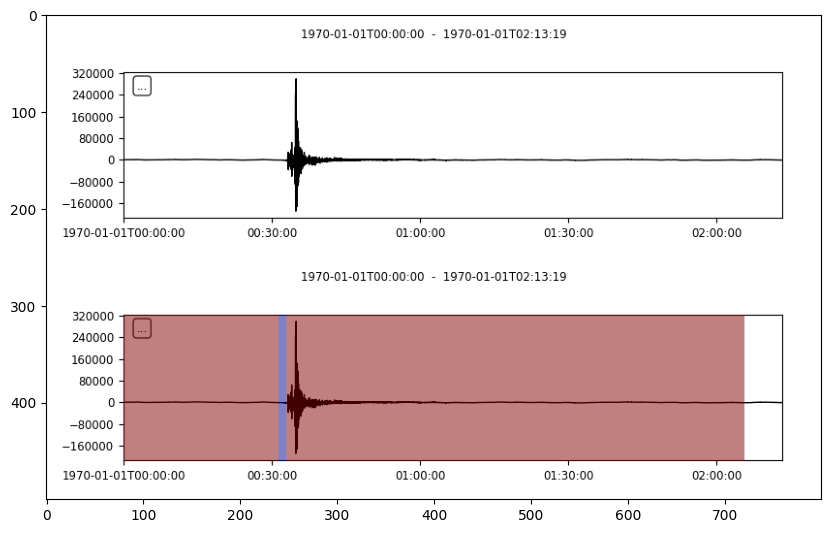

115 : dataset8k_v4/class8/original/202201_16_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


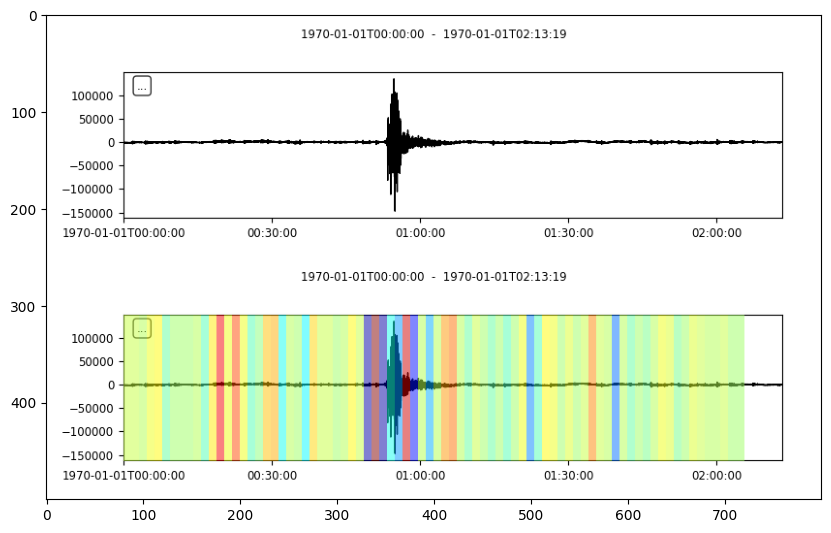

saved 32 files
116 : dataset8k_v4/class8/original/202202_7_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 25ms/step


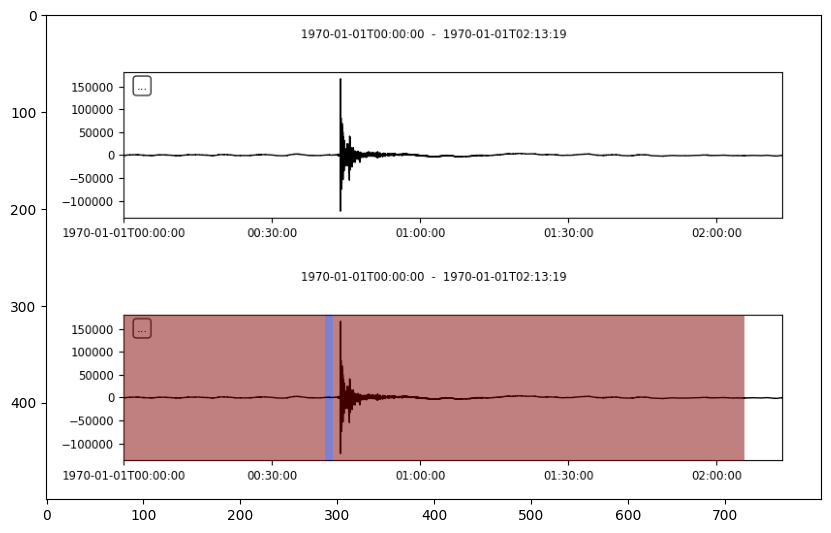

117 : dataset8k_v4/class8/original/202205_10_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


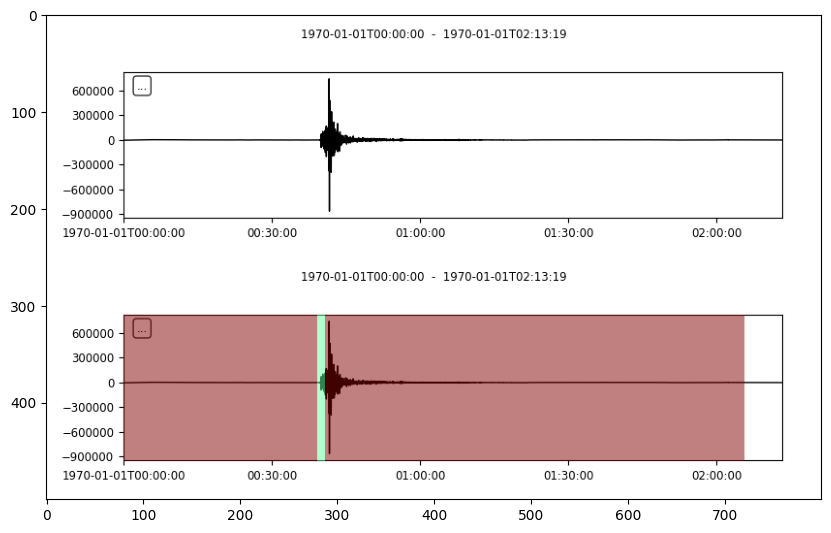

118 : dataset8k_v4/class8/original/202205_15_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 18ms/step


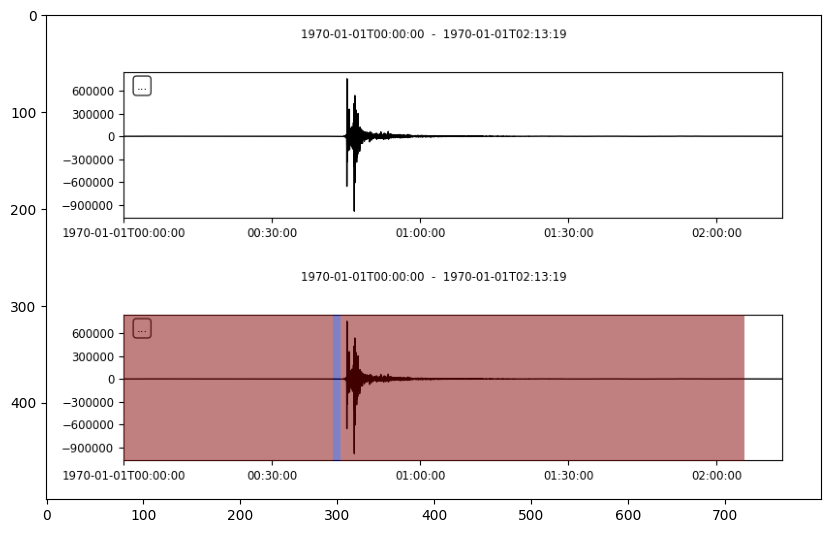

119 : dataset8k_v4/class8/original/202205_8_224__KO.SIMA..BHZ.D.2022.143.183358.SAC_original.sac
1/1 [==============================] - 0s 19ms/step


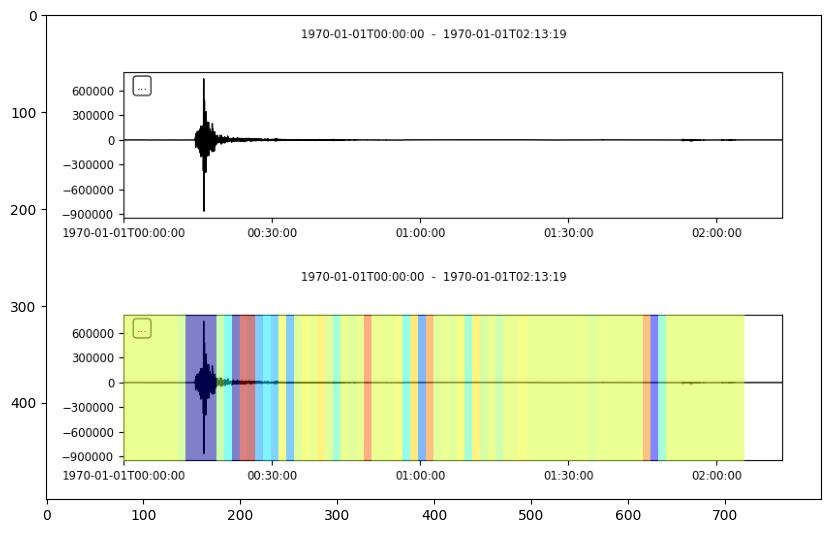

saved 33 files
120 : dataset8k_v4/class8/original/202205_9_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


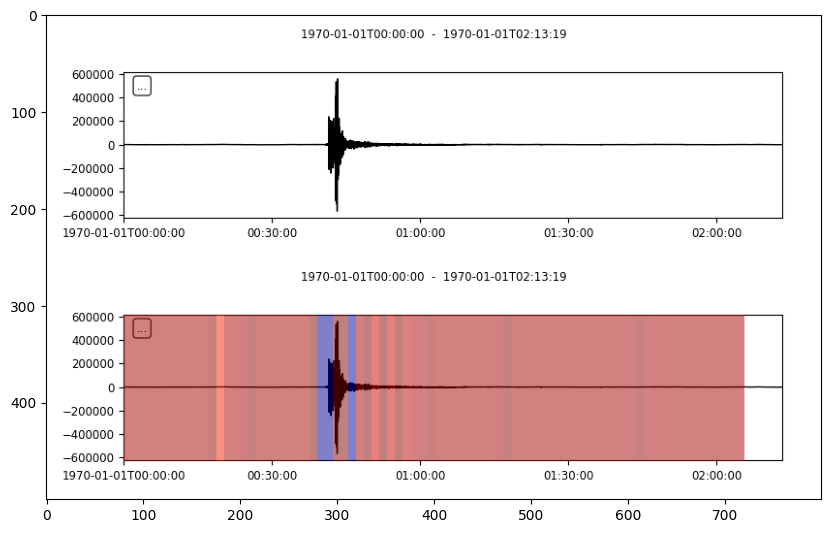

saved 34 files
121 : dataset8k_v4/class8/original/202207_13_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


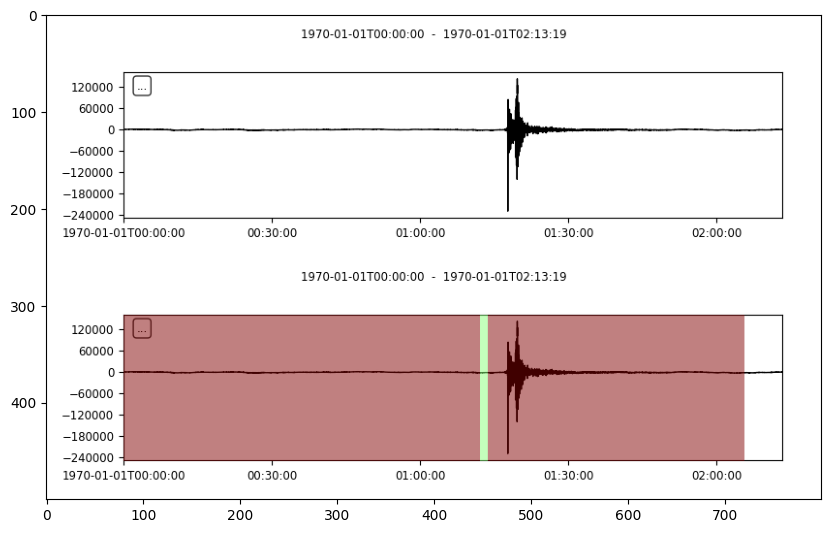

In [9]:

for trace_file in original_trace_file_list[90:]:
    path = os.path.join(dataset, original_class_folder, trace_file) 
    print(f"{index} : {path}")
    index = index + 1
    trace, pred, p_l = colorize(path, divide_number = 80)
    x = input("Press Enter to continue...")
    if x == 'q':
        break
    elif x == 's':
        # copy the file to another folder
        trace.write("./dataset/" + trace_file, format="SAC")
        cs = cs + 1
        print(f"saved {cs} files")


